# Analysis of scRNA-seq data from activated PBMCs 

In CVID and healthy control, 10X platform

Analysis of all the 10X data together: a-CD3/CD28 (here denoted as CD3), CD40L+IL-21 (here denoted as CD40L) and CTLR (unactivated)

In [1]:
import numpy as np
import scrublet as scr
import pandas as pd
import seaborn as sns
import scanpy as sc
from glob import iglob
import anndata
import scipy
import scipy
import bbknn
import os
import sklearn
import matplotlib.pyplot as plt

In [2]:
np.random.seed(0)

In [3]:
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.figdir = './figures/' # specifying output directory for figures
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80)  # low dpi (dots per inch) yields small inline figures

scanpy==1.4.4.post1 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.4 scipy==1.3.2 pandas==0.25.3 scikit-learn==0.21.3 statsmodels==0.10.1 python-igraph==0.7.1 louvain==0.6.1


### Declaring doublet calling functions

In [4]:
def bh(pvalues):
    '''
    Computes the Benjamini-Hochberg FDR correction.
    
    Input:
        * pvals - vector of p-values to correct
    '''
    n = int(pvalues.shape[0])
    new_pvalues = np.empty(n)
    values = [ (pvalue, i) for i, pvalue in enumerate(pvalues) ]
    values.sort()
    values.reverse()
    new_values = []
    for i, vals in enumerate(values):
        rank = n - i
        pvalue, index = vals
        new_values.append((n/rank) * pvalue)
    for i in range(0, int(n)-1):
        if new_values[i] < new_values[i+1]:
            new_values[i+1] = new_values[i]
    for i, vals in enumerate(values):
        pvalue, index = vals
        new_pvalues[index] = new_values[i]
    return new_pvalues

In [5]:
###################
# doublet calling #
###################

def bertie(adata_sample, sample):
    
    scorenames = ['scrublet_score','scrublet_cluster_score','bh_pval']
    
    # set up and run Scrublet
    scrub = scr.Scrublet(adata_sample.X)
    doublet_scores, predicted_doublets = scrub.scrub_doublets(verbose=False)
    adata_sample.obs['scrublet_score'] = doublet_scores
    
    # overcluster prep. run turbo basic scanpy pipeline
    sc.pp.normalize_per_cell(adata_sample, counts_per_cell_after=1e4)
    sc.pp.log1p(adata_sample)
    sc.pp.highly_variable_genes(adata_sample, min_mean=0.0125, max_mean=3, min_disp=0.5)
    adata_sample = adata_sample[:, adata_sample.var['highly_variable']]
    sc.pp.scale(adata_sample, max_value=10)
    sc.tl.pca(adata_sample, svd_solver='arpack')
    sc.pp.neighbors(adata_sample)
    
    # overclustering proper - do basic clustering first, then cluster each cluster
    sc.tl.louvain(adata_sample)
    for clus in np.unique(adata_sample.obs['louvain']):
        sc.tl.louvain(adata_sample, restrict_to=('louvain',[clus]))
        adata_sample.obs['louvain'] = adata_sample.obs['louvain_R']
        
    # compute the cluster scores - the median of Scrublet scores per overclustered cluster
    for clus in np.unique(adata_sample.obs['louvain']):
        adata_sample.obs.loc[adata_sample.obs['louvain']==clus, 'scrublet_cluster_score'] = \
            np.median(adata_sample.obs.loc[adata_sample.obs['louvain']==clus, 'scrublet_score'])
        
    # now compute doublet p-values. figure out the median and mad (from above-median values) for the distribution
    med = np.median(adata_sample.obs['scrublet_cluster_score'])
    mask = adata_sample.obs['scrublet_cluster_score']>med
    mad = np.median(adata_sample.obs['scrublet_cluster_score'][mask]-med)
    
    #let's do a one-sided test. the Bertie write-up does not address this but it makes sense
    pvals = 1-scipy.stats.norm.cdf(adata_sample.obs['scrublet_cluster_score'], loc=med, scale=1.4826*mad)
    adata_sample.obs['bh_pval'] = bh(pvals)
    
    
    return adata_sample.obs[scorenames]

## Reading and preprocessing

In [6]:
samples_activation = ['Immunodeficiency8103070', # seq_batch 1
                      'Immunodeficiency8103072', 'Immunodeficiency8103073', # seq_batch 2
                      'Immunodeficiency8103074', # seq_batch 3
                      'Immunodeficiency8103076', 'Immunodeficiency8103077'] # seq_batch 4

In [7]:
# Annotation / metadata
sample_to_condition_activation = {}

# First 3 is CVID
# Last 3 is healthy (CONTROL)

sample_to_condition_activation['Immunodeficiency8103070'] = ['CVID', 'CTRL']
sample_to_condition_activation['Immunodeficiency8103072'] = ['CVID', 'CD40L']
sample_to_condition_activation['Immunodeficiency8103073'] = ['CVID', 'CD3']

sample_to_condition_activation['Immunodeficiency8103074'] = ['CONTROL', 'CTRL']
sample_to_condition_activation['Immunodeficiency8103076'] = ['CONTROL', 'CD40L']
sample_to_condition_activation['Immunodeficiency8103077'] = ['CONTROL', 'CD3']


In the next cell below:
- read the raw file (output of cellranger)
- do step 1 of calling doublets according to bertie doublet caller and adding all the scores 
- Add %mt genes
- Add relevant annotation info

Later after looking at QC:
- Filter: a) cells (< 200 genes); b) genes (< 3 cells);

In [15]:
%%time

holder = []

scorenames = ['scrublet_score','scrublet_cluster_score','bh_pval']

samples_activation = list(samples_activation)

for sample in samples_activation:
    print('sample',sample, list(samples_activation).index(sample)+1,'out of',len(samples_activation))
    path = '/home/jovyan/notebooks/Vento_Lab/CVID/activation_matrices/filtered_feature_bc_matrix_'+sample+'.h5'
    holder.append(sc.read_10x_h5(path))
 
    # Filer cells with less than 200 genes expressed
    sc.pp.filter_cells(holder[-1], min_genes=200)
    
    # Filer genes expressed in less than 3 cells
    sc.pp.filter_genes(holder[-1], min_cells=3)
    
    # Adding metadata - condition & activation molecule
    holder[-1].obs['condition'] = sample_to_condition_activation[sample][0]
    holder[-1].obs['activation'] = sample_to_condition_activation[sample][1]
    holder[-1].obs['technique'] = '10X'
    
    # Sample information
    holder[-1].obs['sample'] = sample
    
    # Extract mitochondial genes
    mito_genes = [name for name in holder[-1].var_names if name.startswith('MT-')]
    #for each cell compute fraction of counts in mito genes vs. all genes
    #the `.A1` is only necessary, as X is sparse - it transform to a dense array after summing
    holder[-1].obs['percent_mito'] = np.sum(
        holder[-1][:, mito_genes].X, axis=1).A1 / np.sum(holder[-1].X, axis=1).A1
    
    #add the total counts per cell as observations-annotation to adata
    holder[-1].obs['n_counts'] = holder[-1].X.sum(axis=1).A1
    
    #holder[-1].var_names_make_unique()
    #holder[-1].obs_names_make_unique()
    
    # calling doublets on current sample's adata which is holder[-1]
    print('going on to call doublets (write doublet scores into tables) with bertie')
    scores_table = bertie(holder[-1], sample)
    if list(scores_table.index) == list(holder[-1].obs.index):
        print('indices in current bertie table and sample adata are matching, assigning scores')
        for meta in scorenames:
            holder[-1].obs[meta] = scores_table[meta]
    else:
        print('indices in current bertie table and sample adata are NOT matching')
    


sample Immunodeficiency8103070 1 out of 6
reading /home/jovyan/notebooks/Vento_Lab/CVID/activation_matrices/filtered_feature_bc_matrix_Immunodeficiency8103070.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:00)
filtered out 9 cells that haveless than 200 genes expressed


Trying to set attribute `.obs` of view, making a copy.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


filtered out 18565 genes that are detectedin less than 3 cells


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


going on to call doublets (write doublet scores into tables) with bertie
normalizing by total count per cell


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA with n_comps = 50
computing PCA on highly variable genes


/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:869: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:02)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 10 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 15 clusters and added
    'louvain_R', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 19 clusters and added
    'louvain_R', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 25 clusters and added
    'louvain_R', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain cl

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:00)
filtered out 54 cells that haveless than 200 genes expressed


Trying to set attribute `.obs` of view, making a copy.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


filtered out 18114 genes that are detectedin less than 3 cells


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


going on to call doublets (write doublet scores into tables) with bertie
normalizing by total count per cell


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA with n_comps = 50
computing PCA on highly variable genes


/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:869: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 7 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 10 clusters and added
    'louvain_R', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 14 clusters and added
    'louvain_R', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 18 clusters and added
    'louvain_R', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clu

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:00)
filtered out 57 cells that haveless than 200 genes expressed


Trying to set attribute `.obs` of view, making a copy.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


filtered out 18119 genes that are detectedin less than 3 cells


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


going on to call doublets (write doublet scores into tables) with bertie
normalizing by total count per cell


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
computing PCA with n_comps = 50
computing PCA on highly variable genes


/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:869: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 9 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 14 clusters and added
    'louvain_R', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 20 clusters and added
    'louvain_R', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 26 clusters and added
    'louvain_R', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clu

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:00)
filtered out 6 cells that haveless than 200 genes expressed


Trying to set attribute `.obs` of view, making a copy.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


filtered out 20391 genes that are detectedin less than 3 cells


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


going on to call doublets (write doublet scores into tables) with bertie
normalizing by total count per cell


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:869: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


computing PCA with n_comps = 50
computing PCA on highly variable genes
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 6 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 10 clusters and added
    'louvain_R', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 14 clusters and added
    'louvain_R', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 17 clusters and added
    'louvain_R', th

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:00)
filtered out 70 cells that haveless than 200 genes expressed


Trying to set attribute `.obs` of view, making a copy.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


filtered out 18728 genes that are detectedin less than 3 cells


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


going on to call doublets (write doublet scores into tables) with bertie
normalizing by total count per cell


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:869: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


computing PCA with n_comps = 50
computing PCA on highly variable genes
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 6 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 13 clusters and added
    'louvain_R', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 17 clusters and added
    'louvain_R', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 21 clusters and added
    'louvain_R', th

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:01)
filtered out 101 cells that haveless than 200 genes expressed


Trying to set attribute `.obs` of view, making a copy.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


filtered out 16983 genes that are detectedin less than 3 cells


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


going on to call doublets (write doublet scores into tables) with bertie
normalizing by total count per cell


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:869: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


computing PCA with n_comps = 50
computing PCA on highly variable genes
    finished (0:00:04)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:02)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 12 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 19 clusters and added
    'louvain_R', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 25 clusters and added
    'louvain_R', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 28 clusters and added
    'louvain_R', t

# QC, cutoff decisions and reading again

In [42]:
# concatenate all samples into 1 object
adata = holder[0].concatenate(holder[1:],join='outer',index_unique=None)

AnnData object with n_obs × n_vars = 24841 × 33694 
    obs: 'activation_mol', 'batch', 'bh_pval', 'condition', 'n_counts', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'log_counts', 'n_genes'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'highly_variable-2', 'means-2', 'dispersions-2', 'dispersions_norm-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'highly_variable-3', 'means-3', 'dispersions-3', 'dispersions_norm-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'highly_variable-4', 'means-4', 'dispersions-4', 'dispersions_norm-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'highly_variable-5', 'means-5', 'dispersions-5', 'dispersions_norm-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'highly_variable-6'

In [39]:
# Quality control - calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)  

In [40]:
# median of dtected genes
np.median(adata.obs['n_genes'])

1230.0

... storing 'activation_mol' as categorical
... storing 'condition' as categorical
... storing 'sample' as categorical
... storing 'technique' as categorical
... storing 'feature_types-0' as categorical
... storing 'genome-0' as categorical
... storing 'feature_types-1' as categorical
... storing 'genome-1' as categorical
... storing 'feature_types-2' as categorical
... storing 'genome-2' as categorical
... storing 'feature_types-3' as categorical
... storing 'genome-3' as categorical
... storing 'feature_types-4' as categorical
... storing 'genome-4' as categorical
... storing 'feature_types-5' as categorical
... storing 'genome-5' as categorical
... storing 'feature_types-6' as categorical
... storing 'genome-6' as categorical
... storing 'feature_types-7' as categorical
... storing 'genome-7' as categorical
/opt/conda/lib/python3.7/site-packages/scanpy/plotting/_anndata.py:311: DeprecationWarning: Use obs_vector instead of _get_obs_array, _get_obs_array will be removed in the future

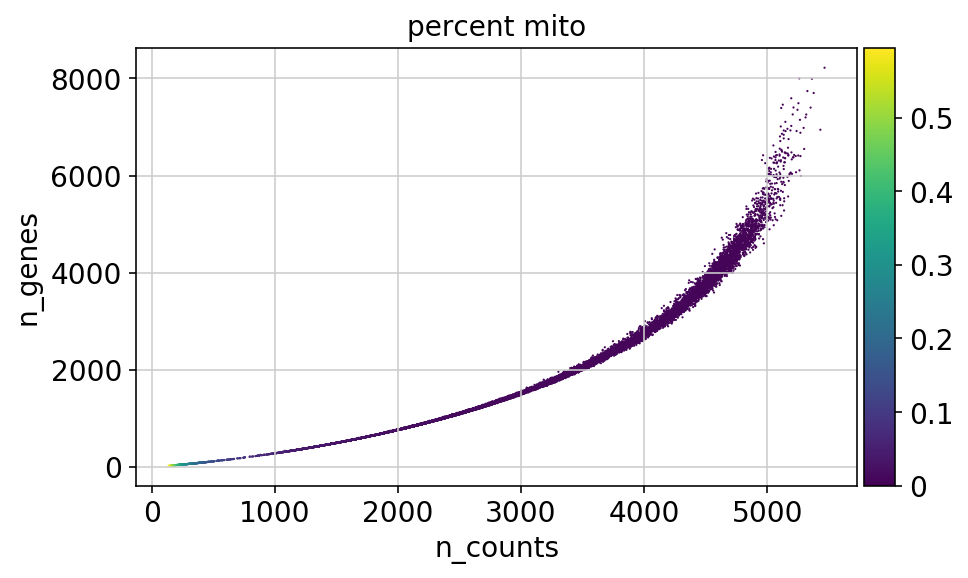

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
/opt/conda/lib/python3.7/site-packages/scanpy/plotting/_anndata.py:311: DeprecationWarning: Use obs_vector instead of _get_obs_array, _get_obs_array will be removed in the future.
  x_arr = adata._get_obs_array(x, use_raw=use_raw, layer=layers[0])
/opt/conda/lib/python3.7/site-packages/anndata/core/anndata.py:1475: FutureWarning: In a future version of AnnData, access to `.X` by passing `layer='X'` will be removed. Instead pass `layer=None`.
  FutureWarning
/opt/conda/lib/python3.7/site-packages/scanpy/plotting/_anndata.py:312: DeprecationWarning: Use obs_vector instead of _get_obs_array, _get_obs_array will be removed in the future.
  y_arr = adata._get_obs_array(y, use_raw=use_raw, layer=layers[1])
/opt/conda/lib/python3.7/site-packages/anndata/core/anndata.py:1475: FutureWarning: In a future version of AnnData, ac

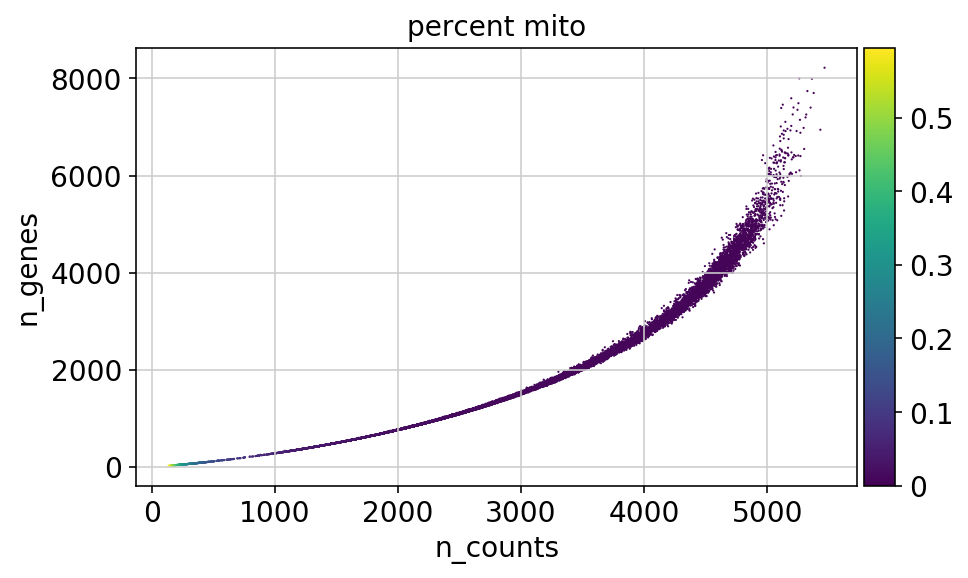

In [41]:
#Data quality summary plots
p1 = sc.pl.scatter(adata, 'n_counts', 'n_genes', color='percent_mito')
p2 = sc.pl.scatter(adata[adata.obs['n_counts']<10000], 'n_counts', 'n_genes', color='percent_mito')


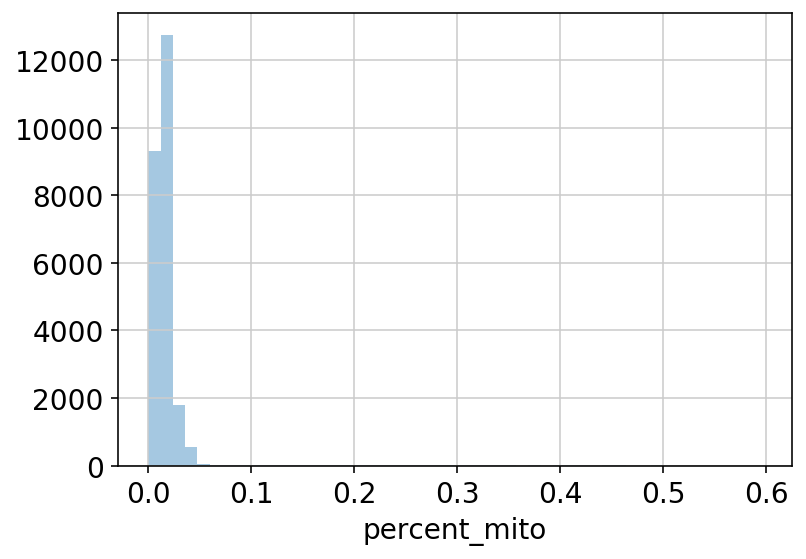

In [43]:
p3 = sns.distplot(adata.obs['percent_mito'], kde=False)
plt.show()

In [44]:
np.percentile(list(adata.obs['percent_mito']),20)

0.008751087822020054

In [45]:
len(adata[adata.obs['percent_mito'] > 0.2])

178

In [46]:
len(adata[adata.obs['percent_mito'] > 0.2])/len(adata.obs)

0.007165573044563423

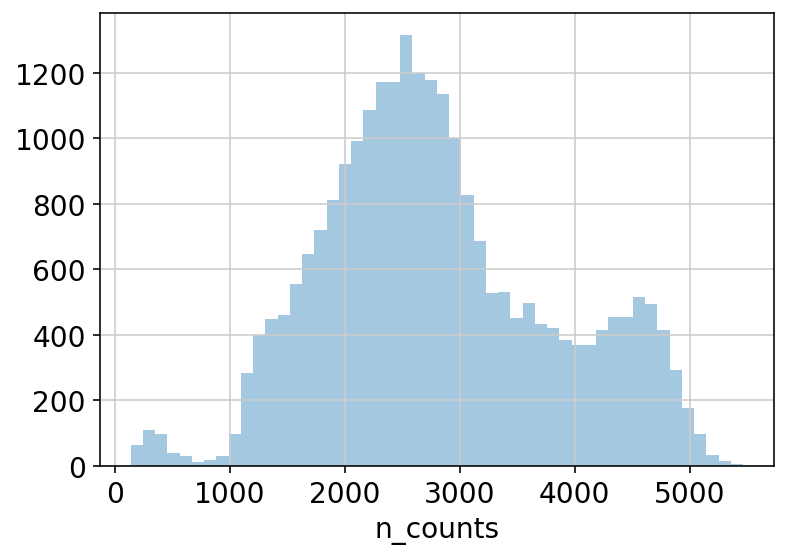

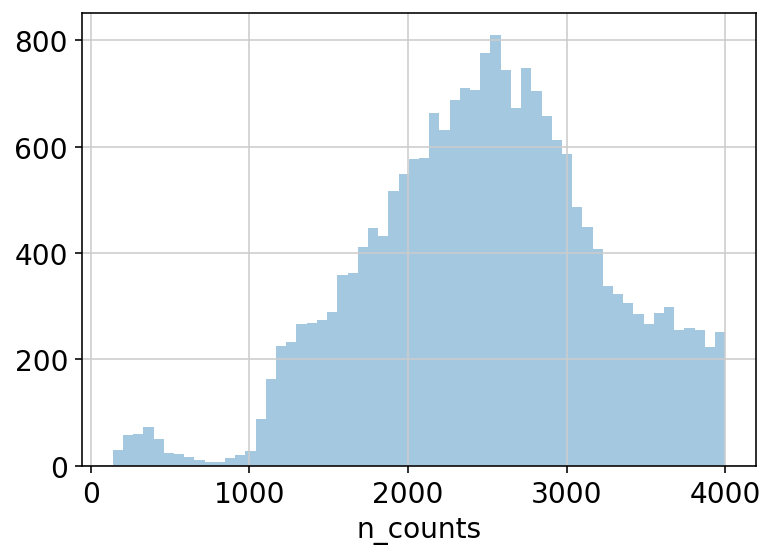

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:198: RuntimeWarning: Mean of empty slice.
  line, = ax.plot(a.mean(), 0)
/opt/conda/lib/python3.7/site-packages/numpy/core/_methods.py:85: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


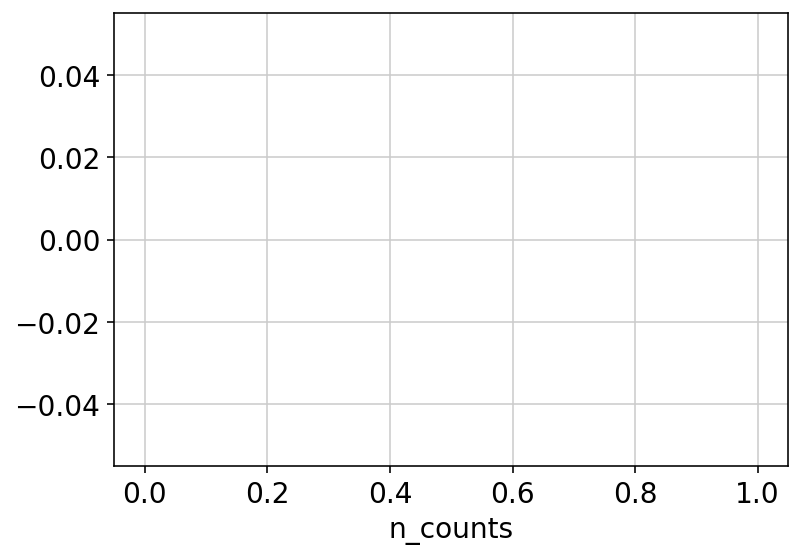

In [47]:
# Thresholding decision: counts
p3 = sns.distplot(adata.obs['n_counts'], kde=False)
plt.show()

p4 = sns.distplot(adata.obs['n_counts'][adata.obs['n_counts']<4000], kde=False, bins=60)
plt.show()

p5 = sns.distplot(adata.obs['n_counts'][adata.obs['n_counts']>10000], kde=False, bins=60)
plt.show()


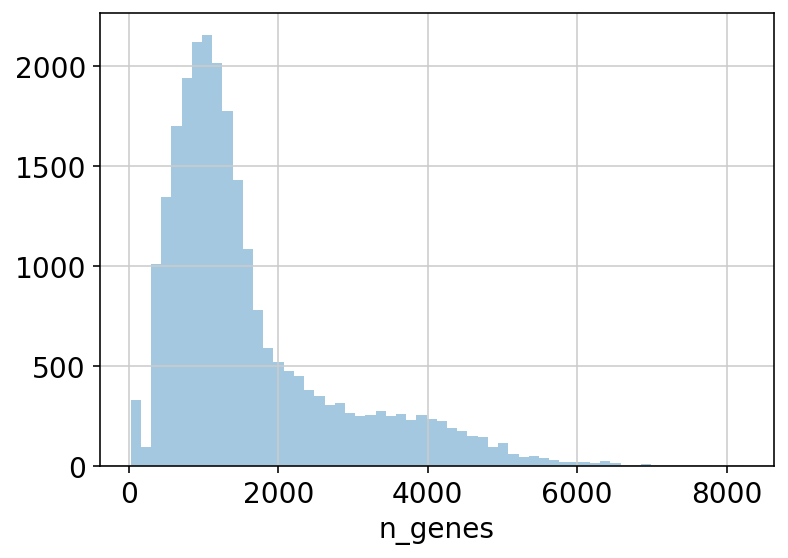

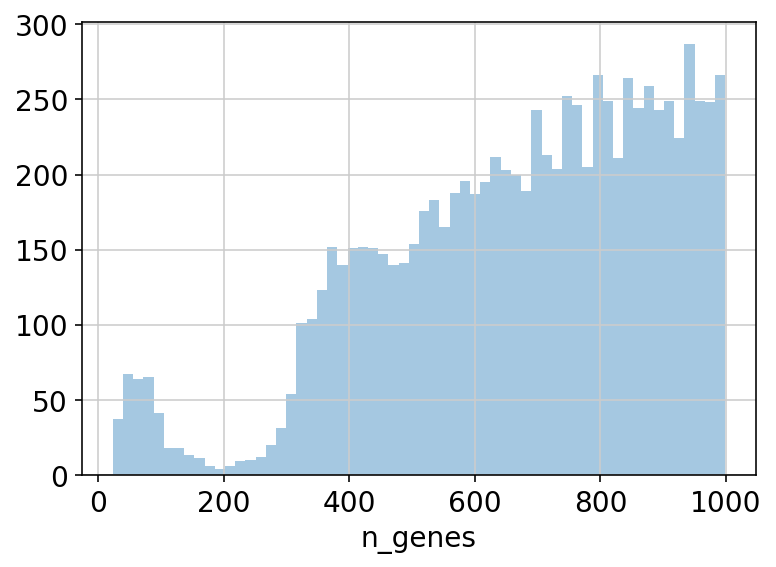

In [48]:
# Thresholding decision: genes
p6 = sns.distplot(adata.obs['n_genes'], kde=False, bins=60)
plt.show()

p7 = sns.distplot(adata.obs['n_genes'][adata.obs['n_genes']<1000], kde=False, bins=60)
plt.show()

**Desicion**: gene cutoff: min_genes=200, min_cells=3, going back up to reread and filter there

__________________________________________________________________________________________________

#### Adding seq_batch key for sequencing batch

In [70]:
adata.obs['cell_id'] = adata.obs.index

In [71]:
def annot_seq_batch(cell_id):
    curr_sample = adata.obs.loc[cell_id,'sample']
    if curr_sample in ['Immunodeficiency8103070']:
        return('1')
    if curr_sample in ['Immunodeficiency8103072', 'Immunodeficiency8103073']:
        return('2')
    if curr_sample in ['Immunodeficiency8103074']:
        return('3')
    if curr_sample in ['Immunodeficiency8103076', 'Immunodeficiency8103077']:
        return('4')

In [72]:
adata.obs['seq_batch'] = adata.obs['cell_id'].apply(lambda x: annot_seq_batch(x))

_________________________________________________________________________________________________________________________________________________________________________________

After rerunning the reading cell in the beginning carrying on to:
- Concatenate
- Normalise
- Log-transform

In [13]:
%%time

adata = holder[0].concatenate(holder[1:],join='outer',index_unique=None)
adata.X = adata.X.tocsr()

# normalise and log transform
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Or pass `index_unique!=None` to `.concatenate`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


CPU times: user 28.4 s, sys: 4.69 s, total: 33.1 s
Wall time: 33.1 s


Carrying on to 
- Filter MT-high cells (>20%)
- Save raw attribute
- Make cell names (obs) and gene names (var) unique

In [14]:
# mt % filtering
adata = adata[adata.obs['percent_mito'] < 0.2]

# saving the raw attribute
adata.raw = adata

adata.var_names_make_unique()
adata.obs_names_make_unique()



Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


In [15]:
# adding 'is_doublet' annotation by throsholding the bh_pvalue, this is not the end of doublet calling
adata.obs['is_doublet'] = adata.obs['bh_pval'] < 0.1

___________________________________________________________________________________________________________________________________________________________________________

In [66]:
adata

AnnData object with n_obs × n_vars = 17662 × 17976 
    obs: 'activation', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'highly_variable-2', 'means-2', 'dispersions-2', 'dispersions_norm-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'highly_variable-3', 'means-3', 'dispersions-3', 'dispersions_norm-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'highly_variable-4', 'means-4', 'dispersions-4', 'dispersions_norm-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'highly_variable-5', 'means-5', 'dispersions-5', 'dispersions

### Filter Cell cycle genes 
Per genes analysis: identify genes behaving like known cell cycle genes

Here known cyclers are not inHVGs, so doing clustering on the whole object (all genes)

In [67]:
# using the whole object
cellcycle_adata = adata.copy()

In [68]:
# Traspose matrix for a GENE-centered analysis
cellcycle_adata = cellcycle_adata.T

In [69]:
cellcycle_adata.obs.index

Index(['RP11-34P13.7', 'FO538757.3', 'FO538757.2', 'AP006222.2',
       'RP5-857K21.4', 'RP11-206L10.9', 'LINC00115', 'FAM41C', 'NOC2L',
       'KLHL17',
       ...
       'RP11-473I1.6', 'LINC00310', 'HCG22', 'RP1-167O22.1', 'OR2T10',
       'XXbac-BPGBPG55C20.3', 'RP13-735L24.1', 'CDH2', 'HPD', 'PMEL'],
      dtype='object', name='index', length=17976)

In [70]:
# Scale data to unit variance and zero mean
sc.pp.scale(cellcycle_adata, max_value=10)
# Scatter plot in PCA coordinates
sc.tl.pca(cellcycle_adata, svd_solver='arpack')

computing PCA with n_comps = 50
    finished (0:00:21.24)


saving figure to file ./figures/pca_variance_ratio_ccg_identification.pdf


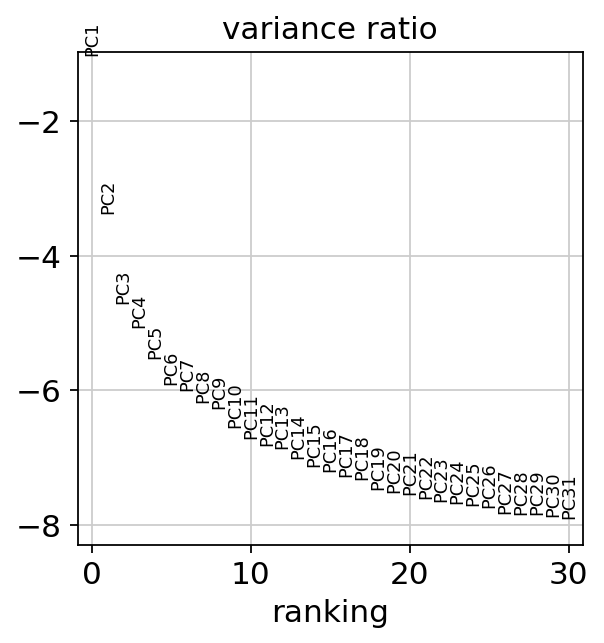

In [71]:
# Plot the variance ratio
sc.pl.pca_variance_ratio(cellcycle_adata, log=True, save='_ccg_identification.pdf')

computing neighbors
    using 'X_pca' with n_pcs = 30


/opt/conda/lib/python3.7/site-packages/numba/compiler.py:588: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../opt/conda/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  self.func_ir.loc))


    finished (0:00:05.19) --> added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix
computing UMAP
    using 'X_pca' with n_pcs = 30
    finished (0:00:18.78) --> added
    'X_umap', UMAP coordinates (adata.obsm)
saving figure to file ./figures/umap_ccg_identification.pdf


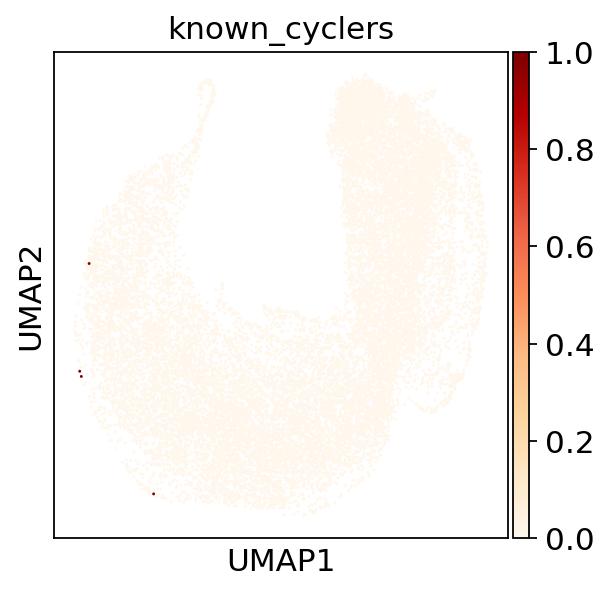

In [77]:
# Identify genes behaving like cc genes
num_pcs = 30
# Compute a neighborhood graph of observations
sc.pp.neighbors(cellcycle_adata,n_pcs=num_pcs)
# Embed the neighborhood graph using UMAP
sc.tl.umap(cellcycle_adata)
cellcycle_adata.obs['known_cyclers'] = [i in ['CDK1','MKI67','CCNB2','PCNA'] for i in cellcycle_adata.obs_names]
# Scatter plot in UMAP basis
sc.pl.umap(cellcycle_adata,color=['known_cyclers'],color_map='OrRd',save='_ccg_identification.pdf')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:02.32) --> found 47 clusters and added
    'louvain', the cluster labels (adata.obs, categorical)


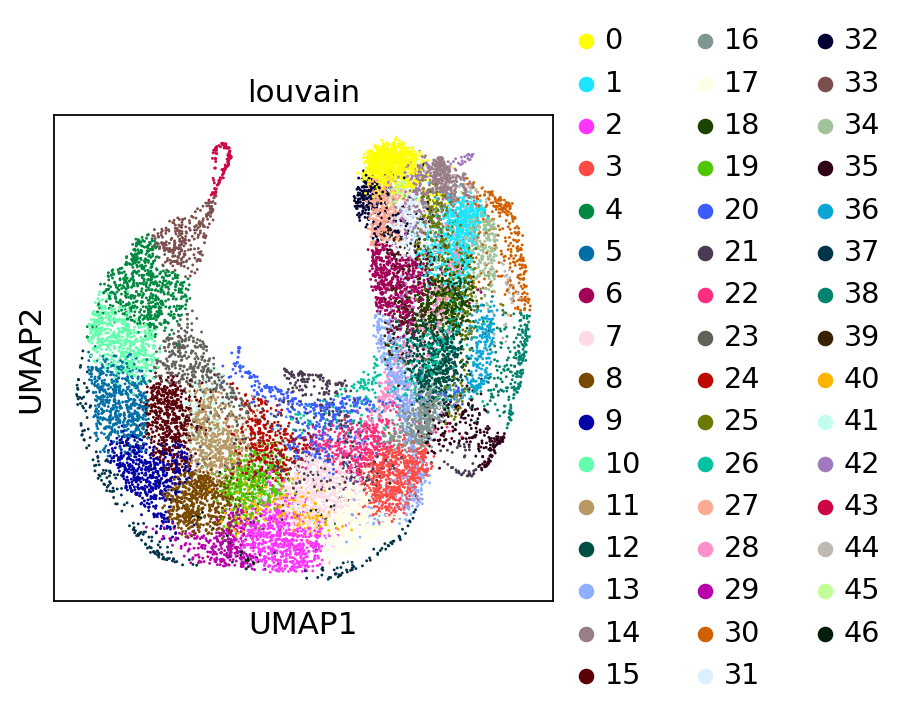

In [79]:
# Cluster GENES into subgroups using louvain: resolution < 1 to find less clusters
sc.tl.louvain(cellcycle_adata, resolution=4)
cellcycle_adata.obs['known_cyclers'] = [i in ['CDK1','MKI67','CCNB2','PCNA'] for i in cellcycle_adata.obs_names]
sc.pl.umap(cellcycle_adata, color=['louvain'])

In [80]:
# Locate genes of interests' cluster
print(cellcycle_adata.obs.loc[['CDK1','MKI67','CCNB2','PCNA'],'louvain'])


index
CDK1     37
MKI67    37
CCNB2    37
PCNA      4
Name: louvain, dtype: category
Categories (47, object): [0, 1, 2, 3, ..., 43, 44, 45, 46]


So here there are no highly influencial cell cycle genes, proceeding

In [81]:
# Add unstructured dict-like annotation for ccgs
adata.uns['ccgs'] = list(cellcycle_adata.obs[(cellcycle_adata.obs['louvain']=='4') | (cellcycle_adata.obs['louvain']=='37')].index)

# Remove cc genes
adata = adata[:,[i not in adata.uns['ccgs'] for i in adata.var_names]]

In [69]:
adata

AnnData object with n_obs × n_vars = 17662 × 17069 
    obs: 'activation', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'highly_variable-2', 'means-2', 'dispersions-2', 'dispersions_norm-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'highly_variable-3', 'means-3', 'dispersions-3', 'dispersions_norm-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'highly_variable-4', 'means-4', 'dispersions-4', 'dispersions_norm-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'highly_variable-5', 'means-5', 'dispersions-5', 'dispersions

### Subsetting to highly variable genes 

In [73]:
%%time
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

extracting highly variable genes
    finished (0:00:03)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
CPU times: user 2 s, sys: 1.61 s, total: 3.62 s
Wall time: 3.61 s


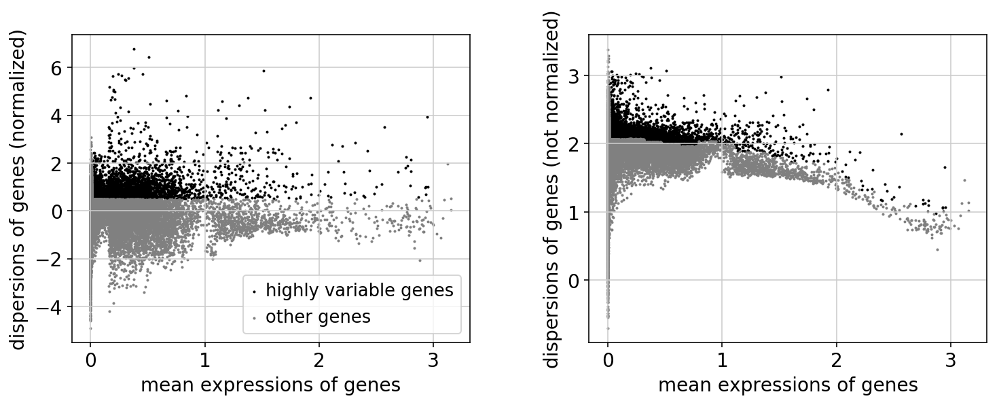

CPU times: user 1.14 s, sys: 796 ms, total: 1.93 s
Wall time: 937 ms


In [74]:
%%time
sc.pl.highly_variable_genes(adata)

In [75]:
adata_hvg = adata[:, adata.var['highly_variable']]

In [76]:
adata_hvg

View of AnnData object with n_obs × n_vars = 17662 × 3987 
    obs: 'activation', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet', 'cell_id', 'seq_batch'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'highly_variable-2', 'means-2', 'dispersions-2', 'dispersions_norm-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'highly_variable-3', 'means-3', 'dispersions-3', 'dispersions_norm-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'highly_variable-4', 'means-4', 'dispersions-4', 'dispersions_norm-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'highly_variable-5', 'means-5'

In [90]:
%%time
sc.pp.scale(adata_hvg, max_value=10)

CPU times: user 444 ms, sys: 484 ms, total: 928 ms
Wall time: 927 ms


_______________________________________________________________________________________________________________________

In [91]:
%%time
sc.tl.pca(adata_hvg, svd_solver='arpack')

computing PCA with n_comps = 50
computing PCA on highly variable genes
    finished (0:00:07.06)
CPU times: user 48.9 s, sys: 15.7 s, total: 1min 4s
Wall time: 7.06 s


_______________________________________________________________________________________________________________________

In [92]:
# bbknn by batch (here batch is sequencing batch)
bbknn.bbknn(adata_hvg, batch_key='seq_batch')

computing batch balanced neighbors


/opt/conda/lib/python3.7/site-packages/umap/umap_.py:349: NumbaWarning: 
Compilation is falling back to object mode WITH looplifting enabled because Function "fuzzy_simplicial_set" failed type inference due to: Untyped global name 'nearest_neighbors': cannot determine Numba type of <class 'function'>

File "../../../../../opt/conda/lib/python3.7/site-packages/umap/umap_.py", line 467:
def fuzzy_simplicial_set(
    <source elided>
    if knn_indices is None or knn_dists is None:
        knn_indices, knn_dists, _ = nearest_neighbors(
        ^

  @numba.jit()
/opt/conda/lib/python3.7/site-packages/numba/compiler.py:725: NumbaWarning: Function "fuzzy_simplicial_set" was compiled in object mode without forceobj=True.

File "../../../../../opt/conda/lib/python3.7/site-packages/umap/umap_.py", line 350:
@numba.jit()
def fuzzy_simplicial_set(
^

  self.func_ir.loc))
/opt/conda/lib/python3.7/site-packages/numba/compiler.py:734: NumbaDeprecationWarning: 
Fall-back from the nopython compilation 

	finished (0:00:03.42) --> added to `.uns['neighbors']`
	'distances', weighted adjacency matrix
	'connectivities', weighted adjacency matrix


__________________________________________________________________________________________________________________________________________________________________

In [93]:
%%time
sc.tl.umap(adata_hvg, random_state=0)

computing UMAP
    using 'X_pca' with n_pcs = 50
    finished (0:00:17.34) --> added
    'X_umap', UMAP coordinates (adata.obsm)
CPU times: user 20.4 s, sys: 7.23 s, total: 27.6 s
Wall time: 17.3 s


### After BBKNN batch correction (by seq_batch)

In [1]:
# after removing CCGs
sc.pl.umap(adata_hvg, color=['condition','activation','seq_batch'])

NameError: name 'sc' is not defined

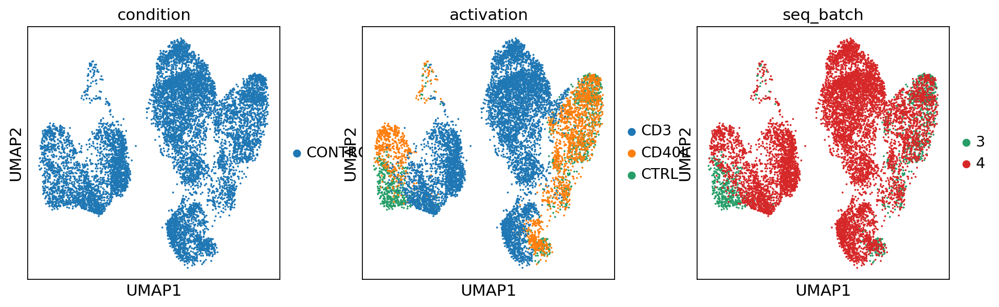

In [95]:
sc.pl.umap(adata_hvg[adata_hvg.obs['condition'] == 'CONTROL'], color=['condition','activation', 'seq_batch'])

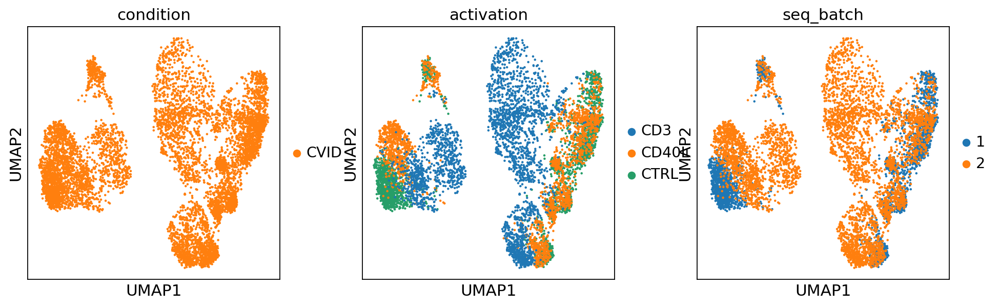

In [96]:
sc.pl.umap(adata_hvg[adata_hvg.obs['condition'] == 'CVID'], color=['condition','activation', 'seq_batch'])

/opt/conda/lib/python3.7/site-packages/anndata/core/anndata.py:299: FutureWarning: In anndata v0.7+, arrays contained within an AnnData object will maintain their dimensionality. For example, prior to v0.7 `adata[0, 0].X` returned a scalar and `adata[0, :]` returned a 1d array, post v0.7 they will return two dimensional arrays. If you would like to get a one dimensional array from your AnnData object, consider using the `adata.obs_vector`, `adata.var_vector` methods or accessing the array directly.
  warn_flatten()


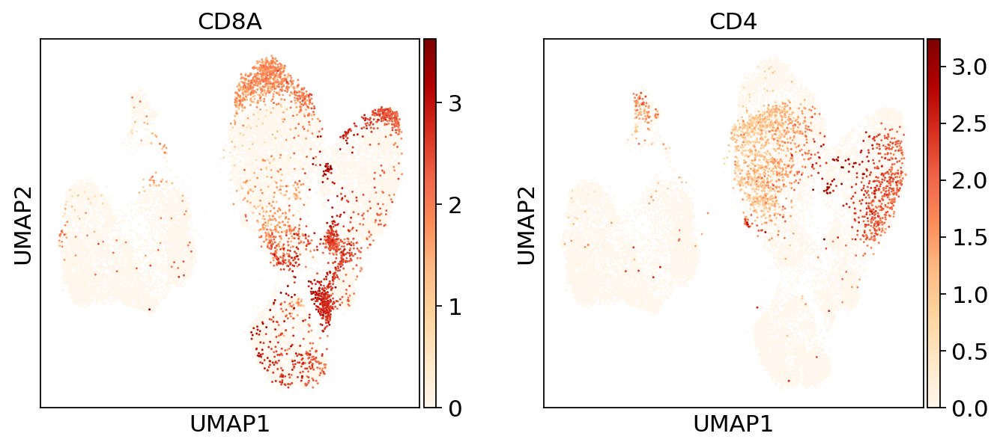

In [97]:
sc.pl.umap(adata_hvg, color=['CD8A','CD4'], use_raw=True, cmap='OrRd')

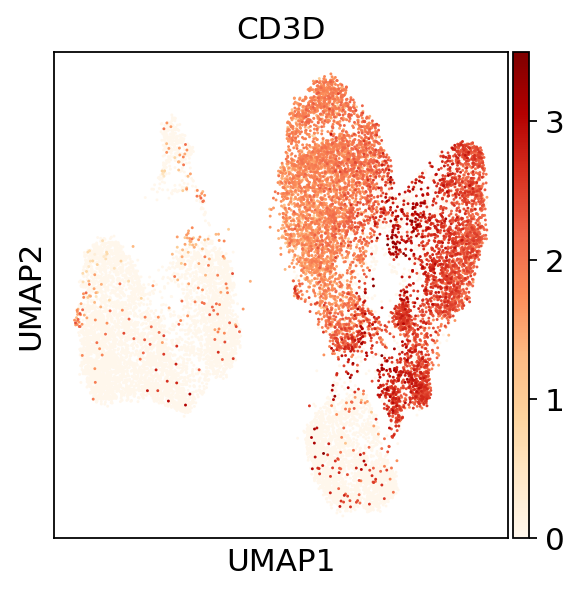

In [98]:
sc.pl.umap(adata_hvg, color=['CD3D'], use_raw=True, cmap='OrRd')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:01.50) --> found 11 clusters and added
    'louvain', the cluster labels (adata.obs, categorical)


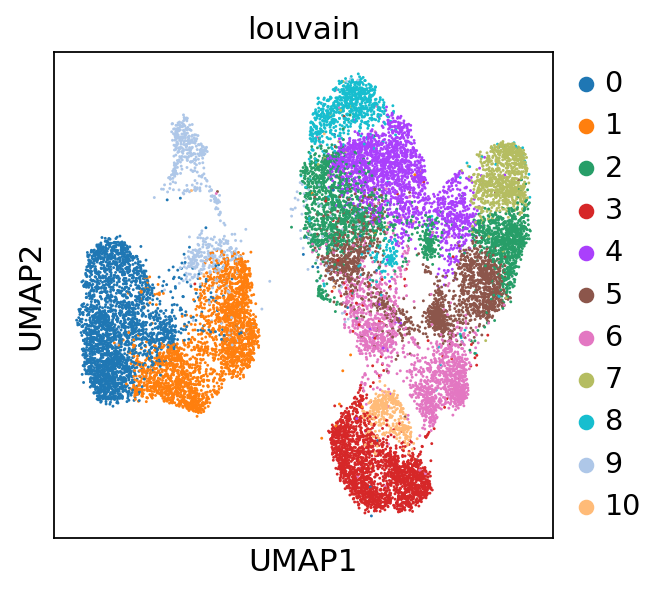

In [100]:
sc.tl.louvain(adata_hvg, random_state=0)
sc.pl.umap(adata_hvg, color=['louvain'])

In [101]:
adata_hvg.write('adata_activation_bbknn_by_seq_batch.h5ad')

At this point we are ready to run the 
### Second step of bertie doublet caller:

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:01.64) --> found 11 clusters and added
    'louvain', the cluster labels (adata.obs, categorical)
         is_doublet
louvain            
0          0.003602
1          0.007491
2          0.002694
3          0.002391
4          0.000991
5          0.002254
6          0.004510
7          0.000000
8          0.005734
9          0.181422
10         0.002695


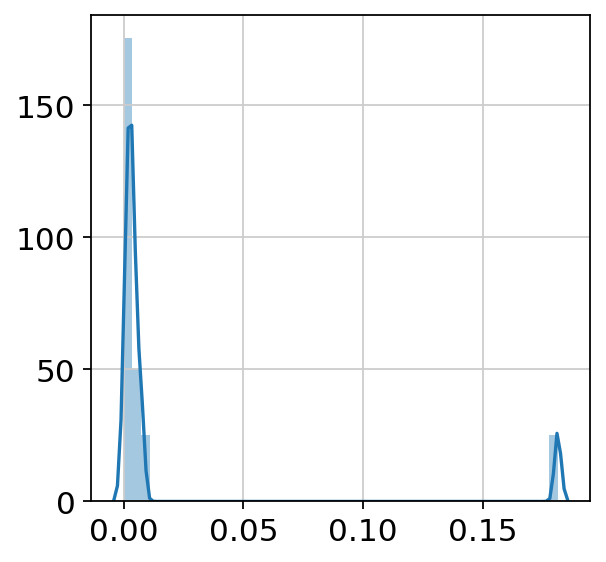

In [102]:
sc.tl.louvain(adata_hvg, random_state=0)
cluster_key = 'louvain'

doublet_counts = adata_hvg.obs.loc[:,['is_doublet', cluster_key]].groupby(cluster_key).mean()
#this can be printed for a summary of per-population doublet frequency...
print(doublet_counts)
#...or shown as a histogram for a potentially useful visualisation
sns.distplot(doublet_counts)

#the actual computation happens here
med = np.median(doublet_counts)
mask = doublet_counts.values>med
mad = np.median(doublet_counts.values[mask]-med)
pvals = 1-scipy.stats.norm.cdf(doublet_counts, loc=med, scale=1.4826*mad)
pvals_adj = bh(pvals)
doublet_populations = list(doublet_counts.index[pvals_adj<0.1])

#flag the entirety of the doublet populations as doublets
adata_hvg.obs['is_doublet_poptrim'] = adata.obs['is_doublet'].copy()
adata_hvg.obs.loc[[i in doublet_populations for i in adata_hvg.obs[cluster_key]],'is_doublet_poptrim'] = True

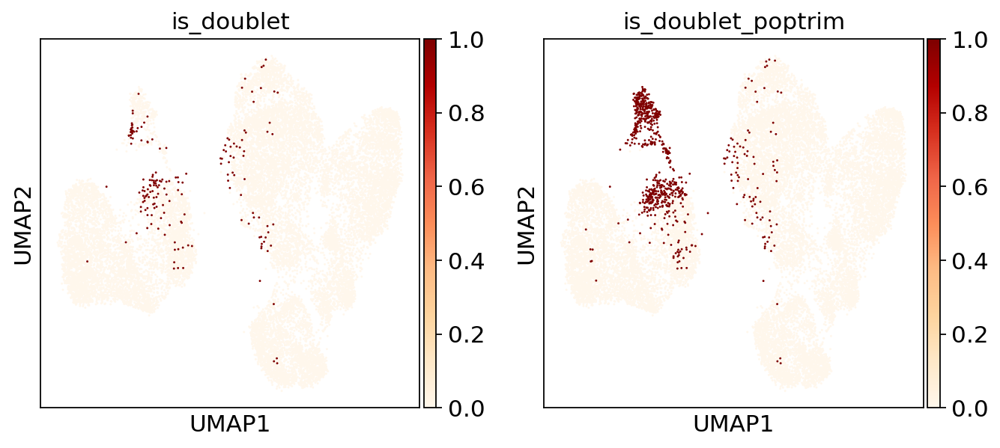

In [103]:
sc.pl.umap(adata_hvg, color=['is_doublet', 'is_doublet_poptrim'], cmap='OrRd')

In [6]:
adata_hvg = sc.read('adata_activation_noCCGs_bbknn_by_seq_batch_noCpG_with_doublets.h5ad')

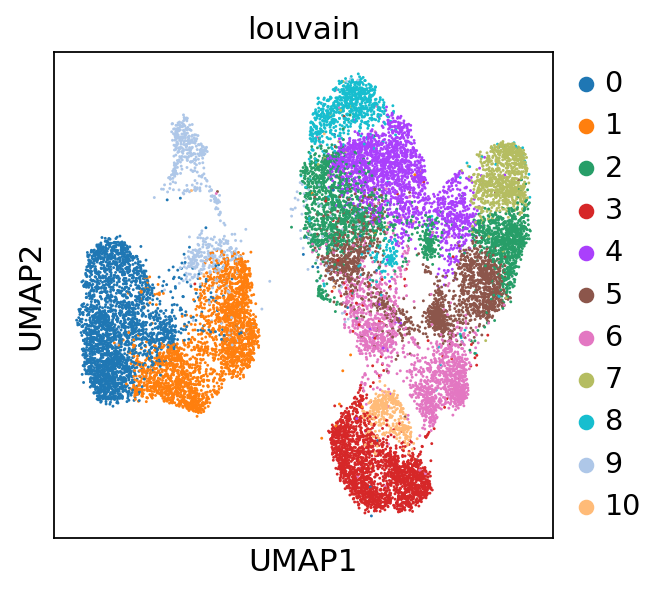

In [10]:
sc.pl.umap(adata_hvg, color='louvain')

In [17]:
# final object, fully processed, no annotation yet
adata_hvg = sc.read('adata_activation_noCCGs_bbknn_by_seq_batch_noCpG_with_doublets.h5ad')

# Annotating clusters 

Using marker genes

In [18]:
adata_hvg.obs['cell_type'] = ['none' for i in range(len(adata_hvg.obs))]

... storing 'cell_type' as categorical


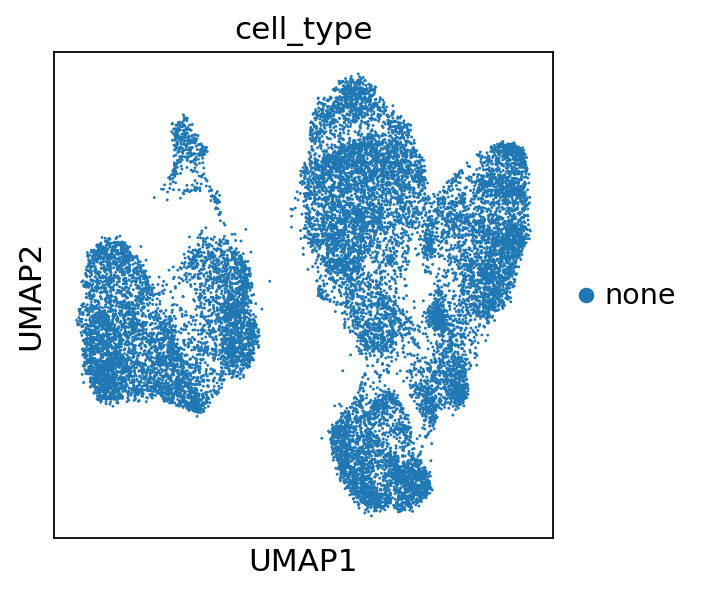

In [19]:
sc.pl.umap(adata_hvg, color=['cell_type'])

In [21]:
sc.tl.louvain(adata_hvg, resolution=1)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:01.52) --> found 11 clusters and added
    'louvain', the cluster labels (adata.obs, categorical)


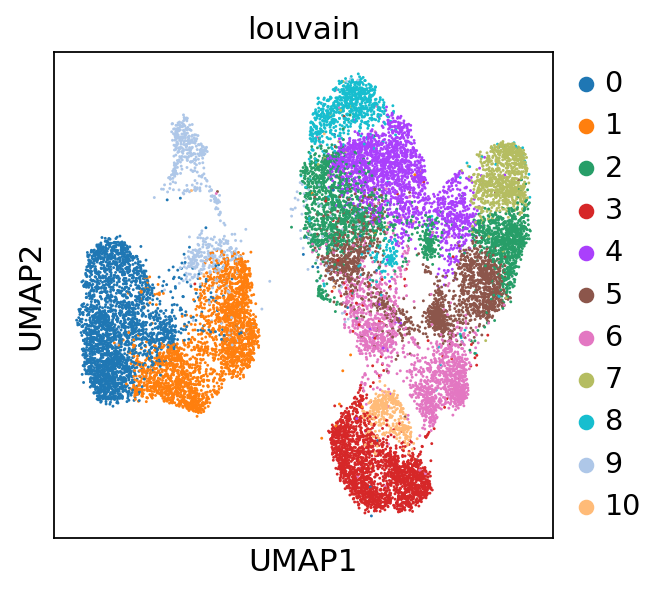

In [22]:
sc.pl.umap(adata_hvg, color='louvain')

## B cells

In [30]:
sc.tl.louvain(adata_hvg, resolution=0.4, restrict_to=('louvain', ['0','1']), key_added='louvain_B')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:00.37) --> found 13 clusters and added
    'louvain_B', the cluster labels (adata.obs, categorical)


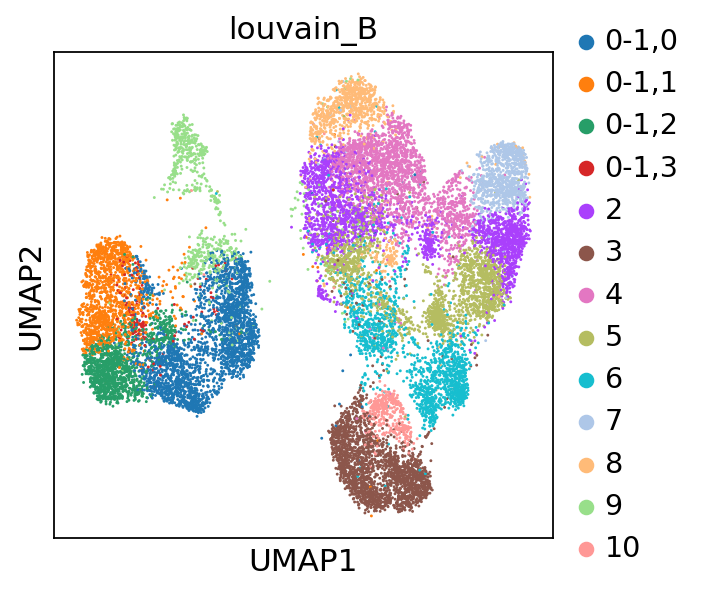

In [31]:
sc.pl.umap(adata_hvg, color=['louvain_B'])


## NK cells

In [34]:
sc.tl.louvain(adata_hvg, resolution=1.2, restrict_to=('louvain', ['3','10']), key_added='louvain_NK')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:00.11) --> found 18 clusters and added
    'louvain_NK', the cluster labels (adata.obs, categorical)


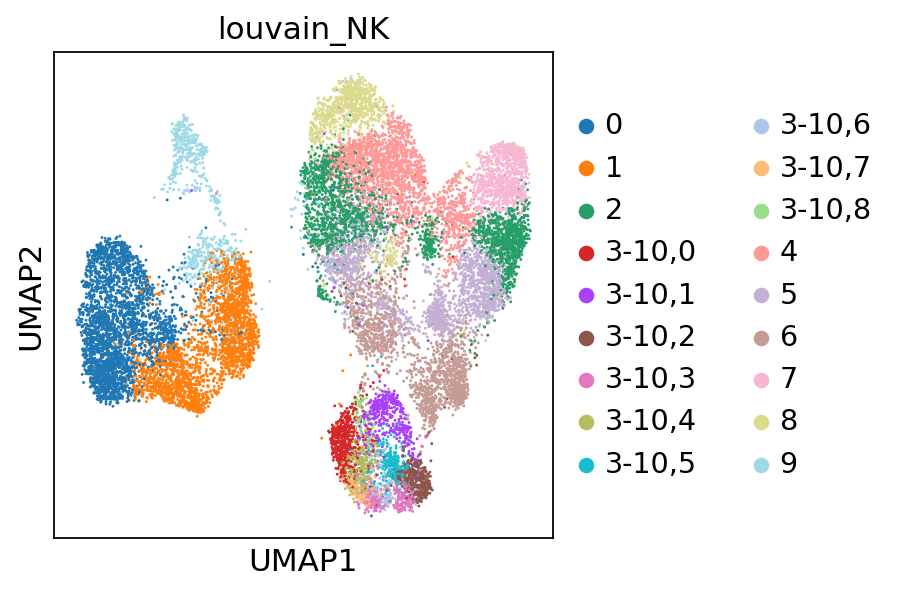

In [35]:
sc.pl.umap(adata_hvg, color=['louvain_NK'])


In [48]:
# for all NK cells, not only 1 (that's not what NK_1 is here)
sc.tl.louvain(adata_hvg, resolution=1.4, restrict_to=('louvain_NK', ['3-10,1','3-10,3']), key_added='louvain_NK_1')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:00.04) --> found 21 clusters and added
    'louvain_NK_1', the cluster labels (adata.obs, categorical)


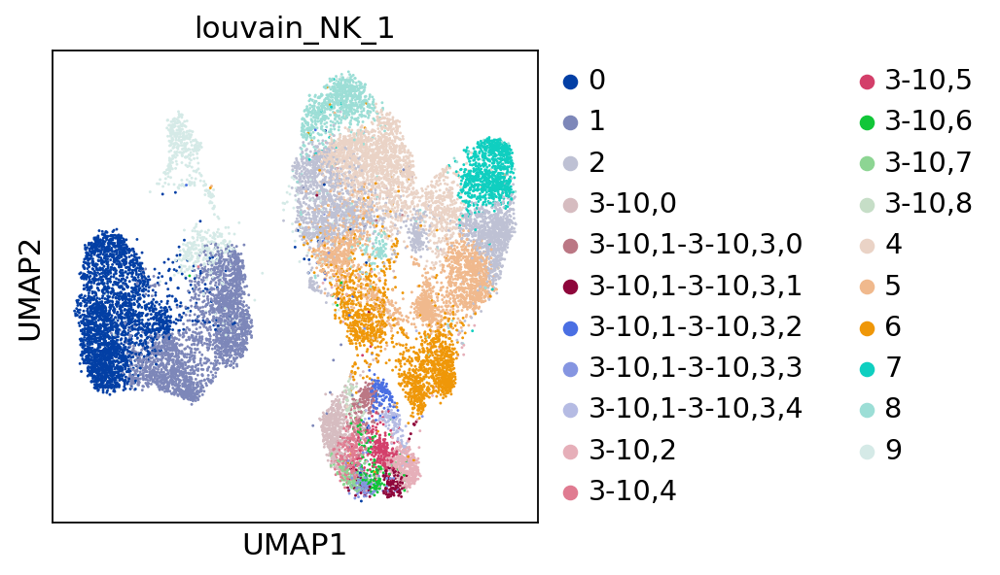

In [49]:
sc.pl.umap(adata_hvg, color=['louvain_NK_1'])


In [53]:
def annot_NK(cell_id):
    if adata_hvg.obs.loc[cell_id, 'louvain_NK_1'] == '3-10,1-3-10,3,4':
        return('NK2')
    if adata_hvg.obs.loc[cell_id, 'louvain_NK_1'] in ['3-10,1-3-10,3,0','3-10,1-3-10,3,2']:
        return('NK2_activated')
    if adata_hvg.obs.loc[cell_id, 'louvain_NK_1'] in ['3-10,2','3-10,5','3-10,1-3-10,3,1']:
        return('NK1')
    if adata_hvg.obs.loc[cell_id, 'louvain_NK_1'] in ['3-10,0','3-10,8','3-10,4','3-10,6','3-10,7', '3-10,1-3-10,3,3']:
        return('NK1_activated')
    
    else:
        return(adata_hvg.obs.loc[cell_id, 'cell_type'])

In [54]:
adata_hvg.obs['cell_type'] = adata_hvg.obs['cell_id'].apply(lambda x: annot_NK(x))

... storing 'cell_type' as categorical


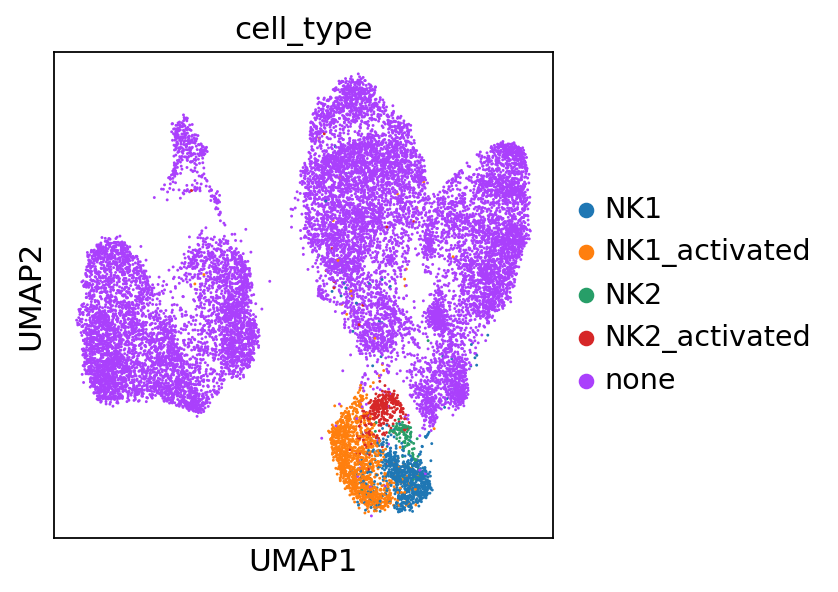

In [55]:
sc.pl.umap(adata_hvg, color=['cell_type'])

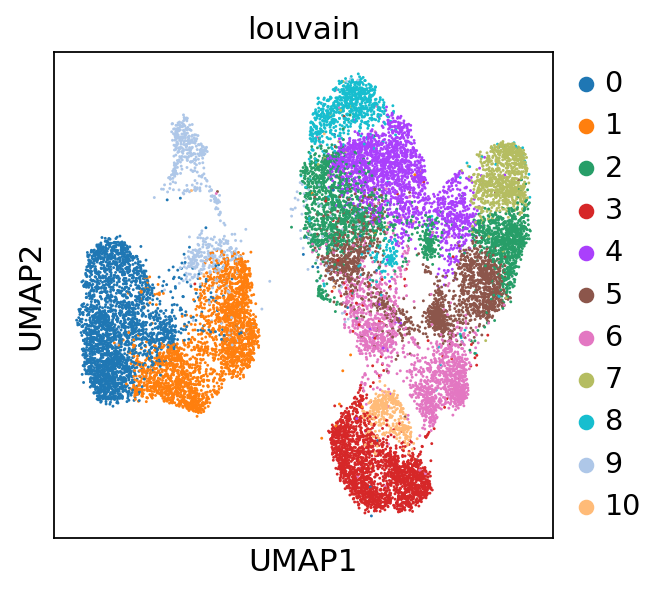

In [56]:
sc.pl.umap(adata_hvg, color=['louvain'])


## Myeloid cells

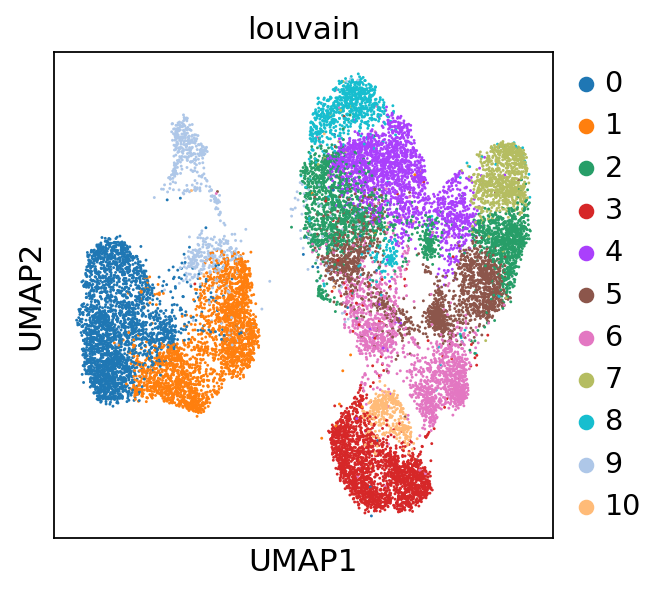

In [59]:
sc.pl.umap(adata_hvg, color=['louvain'])


In [60]:
def annot_myel(cell_id):
    if adata_hvg.obs.loc[cell_id, 'louvain'] == '9':
        return('Mononuclear_phagocytes')
    else:
        return(adata_hvg.obs.loc[cell_id, 'cell_type'])

In [61]:
adata_hvg.obs['cell_type'] = adata_hvg.obs['cell_id'].apply(lambda x: annot_myel(x))

... storing 'cell_type' as categorical


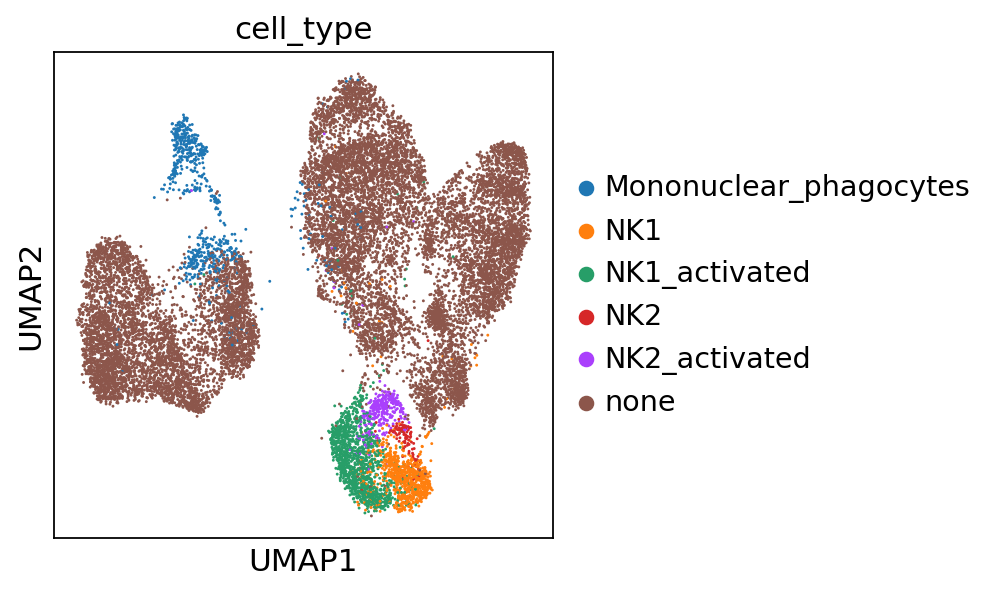

In [62]:
sc.pl.umap(adata_hvg, color=['cell_type'])

## T cells

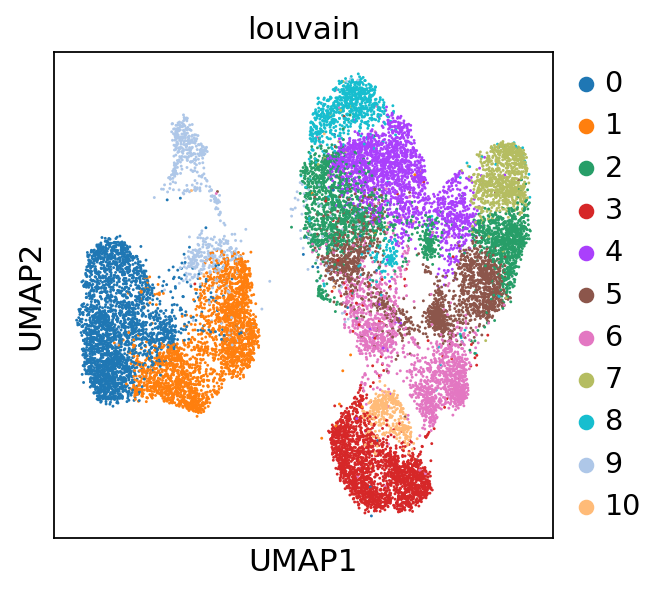

In [63]:
sc.pl.umap(adata_hvg, color=['louvain'])

In [67]:
sc.tl.louvain(adata_hvg, resolution=0.5, restrict_to=('louvain', ['7']), key_added='louvain_R_Tcells_7')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:00.04) --> found 12 clusters and added
    'louvain_R_Tcells_7', the cluster labels (adata.obs, categorical)


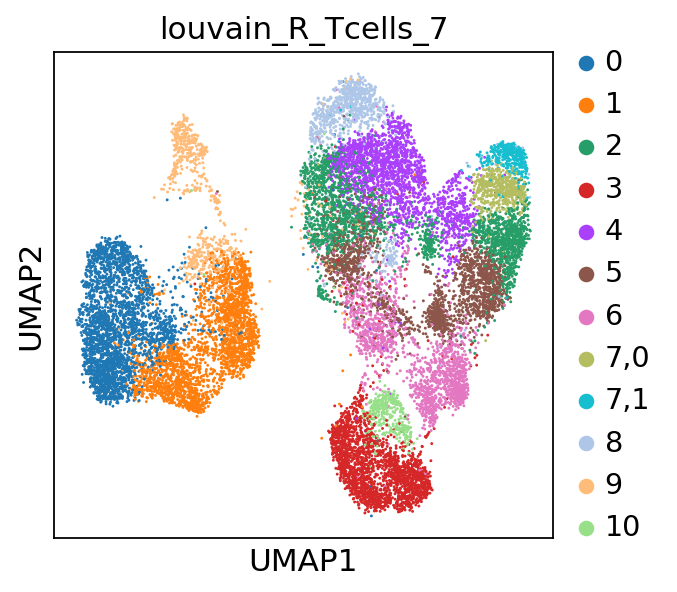

In [68]:
sc.pl.umap(adata_hvg, color=['louvain_R_Tcells_7'])

In [70]:
def annot_T_7_8(cell_id):
    if adata_hvg.obs.loc[cell_id, 'louvain_R_Tcells_7'] == '7,0':
        return('Naive_CD4+_T_cells')
    if adata_hvg.obs.loc[cell_id, 'louvain_R_Tcells_7'] == '7,1':
        return('Naive_CD8+_T_cells')
    else:
        return(adata_hvg.obs.loc[cell_id, 'cell_type'])

In [71]:
adata_hvg.obs['cell_type'] = adata_hvg.obs['cell_id'].apply(lambda x: annot_T_7(x))

... storing 'cell_type' as categorical


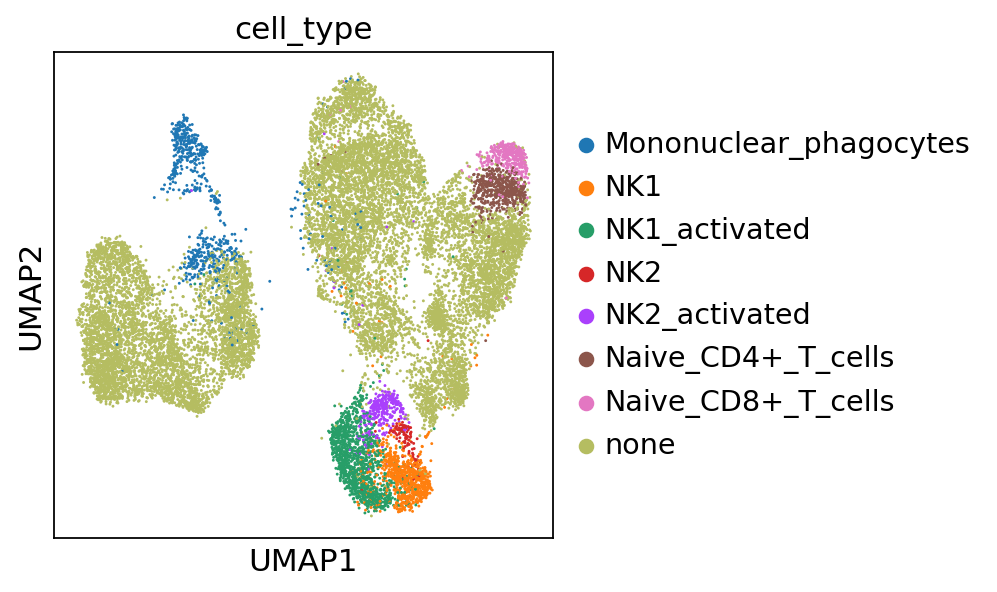

In [72]:
sc.pl.umap(adata_hvg, color=['cell_type'])

In [99]:
#adata_hvg.write('adata_final_annot_interm.h5ad')

In [6]:
#adata_hvg = sc.read('adata_final_annot_interm.h5ad')

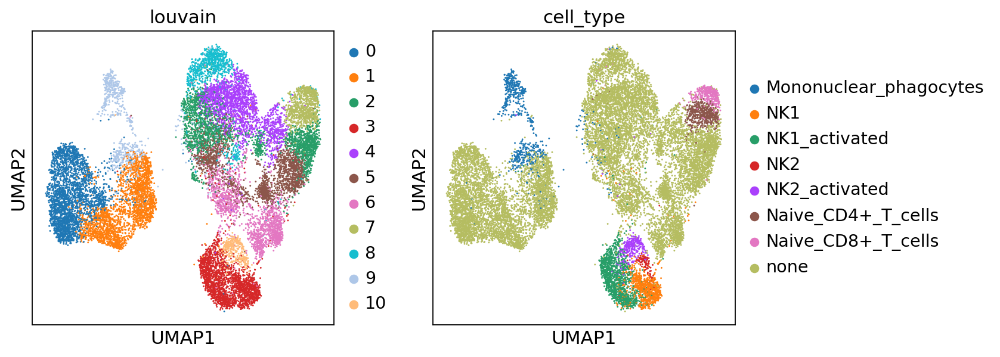

In [7]:
sc.pl.umap(adata_hvg, color=['louvain','cell_type'])

In [8]:
sc.tl.louvain(adata_hvg, resolution=2.0, restrict_to=('louvain', ['2','4','5','6','8']), key_added='louvain_R_Tcells_24568')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:00.46) --> found 23 clusters and added
    'louvain_R_Tcells_24568', the cluster labels (adata.obs, categorical)


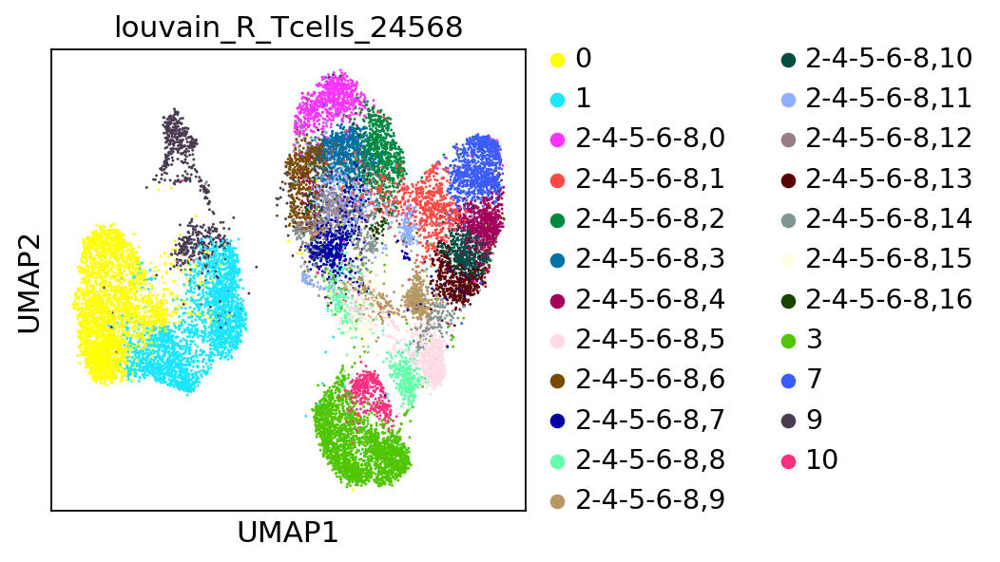

In [9]:
sc.pl.umap(adata_hvg, color=['louvain_R_Tcells_24568'])

In [10]:
sc.tl.louvain(adata_hvg, resolution=1.5, restrict_to=('louvain_R_Tcells_24568', ['2-4-5-6-8,5','2-4-5-6-8,8','2-4-5-6-8,9','2-4-5-6-8,11','2-4-5-6-8,14',
                                                                              '2-4-5-6-8,15','2-4-5-6-8,16']), key_added='louvain_R_Tcells_24568_extra')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:00.12) --> found 29 clusters and added
    'louvain_R_Tcells_24568_extra', the cluster labels (adata.obs, categorical)


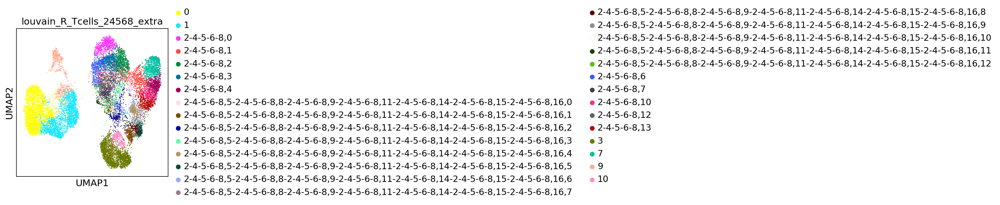

In [11]:
sc.pl.umap(adata_hvg, color=['louvain_R_Tcells_24568_extra'])

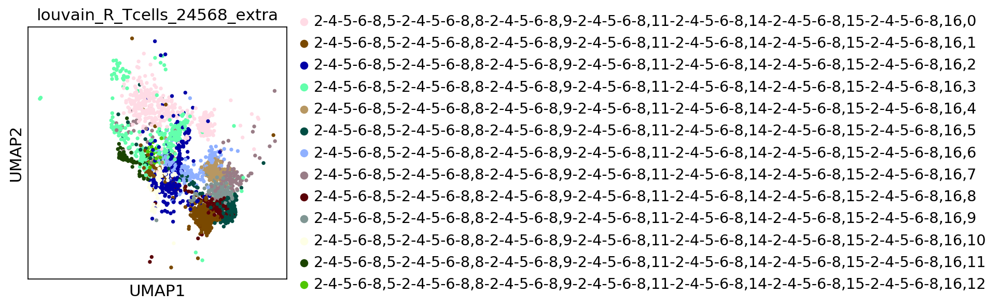

In [12]:
sc.pl.umap(adata_hvg[(adata_hvg.obs['louvain_R_Tcells_24568'] == ['2-4-5-6-8,5'])
                      | (adata_hvg.obs['louvain_R_Tcells_24568'] == ['2-4-5-6-8,8'])
                     | (adata_hvg.obs['louvain_R_Tcells_24568'] == ['2-4-5-6-8,9'])
                     | (adata_hvg.obs['louvain_R_Tcells_24568'] == ['2-4-5-6-8,11'])
                     | (adata_hvg.obs['louvain_R_Tcells_24568'] == ['2-4-5-6-8,14'])
                     | (adata_hvg.obs['louvain_R_Tcells_24568'] == ['2-4-5-6-8,15'])
                     | (adata_hvg.obs['louvain_R_Tcells_24568'] == ['2-4-5-6-8,16'])],
           color=['louvain_R_Tcells_24568_extra'])

In [13]:
np.unique(adata_hvg.obs['louvain_R_Tcells_24568_extra'])

array(['0', '1', '10', '2-4-5-6-8,0', '2-4-5-6-8,1', '2-4-5-6-8,10',
       '2-4-5-6-8,12', '2-4-5-6-8,13', '2-4-5-6-8,2', '2-4-5-6-8,3',
       '2-4-5-6-8,4',
       '2-4-5-6-8,5-2-4-5-6-8,8-2-4-5-6-8,9-2-4-5-6-8,11-2-4-5-6-8,14-2-4-5-6-8,15-2-4-5-6-8,16,0',
       '2-4-5-6-8,5-2-4-5-6-8,8-2-4-5-6-8,9-2-4-5-6-8,11-2-4-5-6-8,14-2-4-5-6-8,15-2-4-5-6-8,16,1',
       '2-4-5-6-8,5-2-4-5-6-8,8-2-4-5-6-8,9-2-4-5-6-8,11-2-4-5-6-8,14-2-4-5-6-8,15-2-4-5-6-8,16,10',
       '2-4-5-6-8,5-2-4-5-6-8,8-2-4-5-6-8,9-2-4-5-6-8,11-2-4-5-6-8,14-2-4-5-6-8,15-2-4-5-6-8,16,11',
       '2-4-5-6-8,5-2-4-5-6-8,8-2-4-5-6-8,9-2-4-5-6-8,11-2-4-5-6-8,14-2-4-5-6-8,15-2-4-5-6-8,16,12',
       '2-4-5-6-8,5-2-4-5-6-8,8-2-4-5-6-8,9-2-4-5-6-8,11-2-4-5-6-8,14-2-4-5-6-8,15-2-4-5-6-8,16,2',
       '2-4-5-6-8,5-2-4-5-6-8,8-2-4-5-6-8,9-2-4-5-6-8,11-2-4-5-6-8,14-2-4-5-6-8,15-2-4-5-6-8,16,3',
       '2-4-5-6-8,5-2-4-5-6-8,8-2-4-5-6-8,9-2-4-5-6-8,11-2-4-5-6-8,14-2-4-5-6-8,15-2-4-5-6-8,16,4',
       '2-4-5-6-8,5-2-4-5-6-8,8-2-4-5

In [15]:
['2-4-5-6-8,5-2-4-5-6-8,8-2-4-5-6-8,9-2-4-5-6-8,11-2-4-5-6-8,14-2-4-5-6-8,15-2-4-5-6-8,16,'+i for i in ['2','3','6','10','11','12']]

['2-4-5-6-8,5-2-4-5-6-8,8-2-4-5-6-8,9-2-4-5-6-8,11-2-4-5-6-8,14-2-4-5-6-8,15-2-4-5-6-8,16,2',
 '2-4-5-6-8,5-2-4-5-6-8,8-2-4-5-6-8,9-2-4-5-6-8,11-2-4-5-6-8,14-2-4-5-6-8,15-2-4-5-6-8,16,3',
 '2-4-5-6-8,5-2-4-5-6-8,8-2-4-5-6-8,9-2-4-5-6-8,11-2-4-5-6-8,14-2-4-5-6-8,15-2-4-5-6-8,16,6',
 '2-4-5-6-8,5-2-4-5-6-8,8-2-4-5-6-8,9-2-4-5-6-8,11-2-4-5-6-8,14-2-4-5-6-8,15-2-4-5-6-8,16,10',
 '2-4-5-6-8,5-2-4-5-6-8,8-2-4-5-6-8,9-2-4-5-6-8,11-2-4-5-6-8,14-2-4-5-6-8,15-2-4-5-6-8,16,11',
 '2-4-5-6-8,5-2-4-5-6-8,8-2-4-5-6-8,9-2-4-5-6-8,11-2-4-5-6-8,14-2-4-5-6-8,15-2-4-5-6-8,16,12']

In [26]:
sc.tl.louvain(adata_hvg, resolution=1.4, restrict_to=('louvain_R_Tcells_24568_extra', 
['2-4-5-6-8,5-2-4-5-6-8,8-2-4-5-6-8,9-2-4-5-6-8,11-2-4-5-6-8,14-2-4-5-6-8,15-2-4-5-6-8,16,'+i for i in ['2','3','6','10','11','12']]), key_added='louvain_R_Tcells_24568_extra_extra')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:00.06) --> found 34 clusters and added
    'louvain_R_Tcells_24568_extra_extra', the cluster labels (adata.obs, categorical)


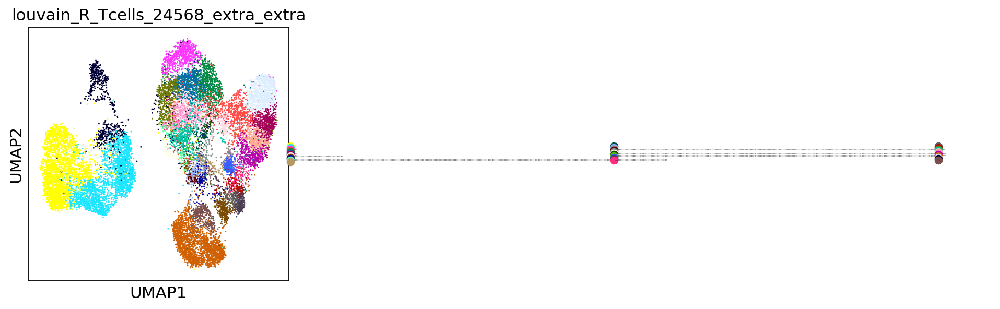

In [27]:
sc.pl.umap(adata_hvg, color=['louvain_R_Tcells_24568_extra_extra'],
          legend_fontsize=0.1)

saving figure to file ./figures/umap_zoom_in.pdf


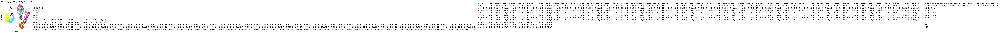

In [29]:
sc.pl.umap(adata_hvg, color=['louvain_R_Tcells_24568_extra_extra'], save='_zoom_in.pdf')

saving figure to file ./figures/umap_zoom_in_1.pdf


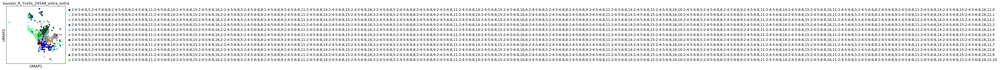

In [32]:
sc.pl.umap(adata_hvg[(adata_hvg.obs['louvain_R_Tcells_24568_extra'] == '2-4-5-6-8,5-2-4-5-6-8,8-2-4-5-6-8,9-2-4-5-6-8,11-2-4-5-6-8,14-2-4-5-6-8,15-2-4-5-6-8,16,2')
                    | (adata_hvg.obs['louvain_R_Tcells_24568_extra'] == '2-4-5-6-8,5-2-4-5-6-8,8-2-4-5-6-8,9-2-4-5-6-8,11-2-4-5-6-8,14-2-4-5-6-8,15-2-4-5-6-8,16,3')
                    | (adata_hvg.obs['louvain_R_Tcells_24568_extra'] == '2-4-5-6-8,5-2-4-5-6-8,8-2-4-5-6-8,9-2-4-5-6-8,11-2-4-5-6-8,14-2-4-5-6-8,15-2-4-5-6-8,16,6')
                    | (adata_hvg.obs['louvain_R_Tcells_24568_extra'] == '2-4-5-6-8,5-2-4-5-6-8,8-2-4-5-6-8,9-2-4-5-6-8,11-2-4-5-6-8,14-2-4-5-6-8,15-2-4-5-6-8,16,10')
                    | (adata_hvg.obs['louvain_R_Tcells_24568_extra'] == '2-4-5-6-8,5-2-4-5-6-8,8-2-4-5-6-8,9-2-4-5-6-8,11-2-4-5-6-8,14-2-4-5-6-8,15-2-4-5-6-8,16,11')
                    | (adata_hvg.obs['louvain_R_Tcells_24568_extra'] == '2-4-5-6-8,5-2-4-5-6-8,8-2-4-5-6-8,9-2-4-5-6-8,11-2-4-5-6-8,14-2-4-5-6-8,15-2-4-5-6-8,16,12')], color=['louvain_R_Tcells_24568_extra_extra'],
          save='_zoom_in_1.pdf')



In [33]:
np.unique(adata_hvg.obs['louvain_R_Tcells_24568_extra_extra'])

array(['0', '1', '10', '2-4-5-6-8,0', '2-4-5-6-8,1', '2-4-5-6-8,10',
       '2-4-5-6-8,12', '2-4-5-6-8,13', '2-4-5-6-8,2', '2-4-5-6-8,3',
       '2-4-5-6-8,4',
       '2-4-5-6-8,5-2-4-5-6-8,8-2-4-5-6-8,9-2-4-5-6-8,11-2-4-5-6-8,14-2-4-5-6-8,15-2-4-5-6-8,16,0',
       '2-4-5-6-8,5-2-4-5-6-8,8-2-4-5-6-8,9-2-4-5-6-8,11-2-4-5-6-8,14-2-4-5-6-8,15-2-4-5-6-8,16,1',
       '2-4-5-6-8,5-2-4-5-6-8,8-2-4-5-6-8,9-2-4-5-6-8,11-2-4-5-6-8,14-2-4-5-6-8,15-2-4-5-6-8,16,2-2-4-5-6-8,5-2-4-5-6-8,8-2-4-5-6-8,9-2-4-5-6-8,11-2-4-5-6-8,14-2-4-5-6-8,15-2-4-5-6-8,16,3-2-4-5-6-8,5-2-4-5-6-8,8-2-4-5-6-8,9-2-4-5-6-8,11-2-4-5-6-8,14-2-4-5-6-8,15-2-4-5-6-8,16,6-2-4-5-6-8,5-2-4-5-6-8,8-2-4-5-6-8,9-2-4-5-6-8,11-2-4-5-6-8,14-2-4-5-6-8,15-2-4-5-6-8,16,10-2-4-5-6-8,5-2-4-5-6-8,8-2-4-5-6-8,9-2-4-5-6-8,11-2-4-5-6-8,14-2-4-5-6-8,15-2-4-5-6-8,16,11-2-4-5-6-8,5-2-4-5-6-8,8-2-4-5-6-8,9-2-4-5-6-8,11-2-4-5-6-8,14-2-4-5-6-8,15-2-4-5-6-8,16,12,0',
       '2-4-5-6-8,5-2-4-5-6-8,8-2-4-5-6-8,9-2-4-5-6-8,11-2-4-5-6-8,14-2-4-5-6-8,15-2-

In [35]:
def annot_T_extra(cell_id):
    T_term = '2-4-5-6-8,'
    T_term_extra = '2-4-5-6-8,5-2-4-5-6-8,8-2-4-5-6-8,9-2-4-5-6-8,11-2-4-5-6-8,14-2-4-5-6-8,15-2-4-5-6-8,16,'
    T_term_extra_extra = '2-4-5-6-8,5-2-4-5-6-8,8-2-4-5-6-8,9-2-4-5-6-8,11-2-4-5-6-8,14-2-4-5-6-8,15-2-4-5-6-8,16,2-2-4-5-6-8,5-2-4-5-6-8,8-2-4-5-6-8,9-2-4-5-6-8,11-2-4-5-6-8,14-2-4-5-6-8,15-2-4-5-6-8,16,3-2-4-5-6-8,5-2-4-5-6-8,8-2-4-5-6-8,9-2-4-5-6-8,11-2-4-5-6-8,14-2-4-5-6-8,15-2-4-5-6-8,16,6-2-4-5-6-8,5-2-4-5-6-8,8-2-4-5-6-8,9-2-4-5-6-8,11-2-4-5-6-8,14-2-4-5-6-8,15-2-4-5-6-8,16,10-2-4-5-6-8,5-2-4-5-6-8,8-2-4-5-6-8,9-2-4-5-6-8,11-2-4-5-6-8,14-2-4-5-6-8,15-2-4-5-6-8,16,11-2-4-5-6-8,5-2-4-5-6-8,8-2-4-5-6-8,9-2-4-5-6-8,11-2-4-5-6-8,14-2-4-5-6-8,15-2-4-5-6-8,16,12,'
    if adata_hvg.obs.loc[cell_id, 'louvain_R_Tcells_24568_extra_extra'] in [T_term+'1',T_term+'4']:
        return('T_regs')
    if adata_hvg.obs.loc[cell_id, 'louvain_R_Tcells_24568_extra_extra'] in [T_term+'10',T_term+'13']:
        return('Memory_CD4+_T_cells')
    if adata_hvg.obs.loc[cell_id, 'louvain_R_Tcells_24568_extra_extra'] in [T_term+'2',T_term+'3',T_term+'6',T_term+'7', T_term+'12']:
        return('Activated_CD4+_T_cells')
    if adata_hvg.obs.loc[cell_id, 'louvain_R_Tcells_24568_extra_extra'] in [T_term+'0']:
        return('Activated_CD8+_T_cells_1')
    if adata_hvg.obs.loc[cell_id, 'louvain_R_Tcells_24568_extra_extra'] in [T_term_extra+'1']:
        return('Memory_CD8+_T_cells')
    if adata_hvg.obs.loc[cell_id, 'louvain_R_Tcells_24568_extra_extra'] in [T_term_extra_extra+i for i in ['0','1','4','6','8','9','10']]:
        return('Activated_CD8+_T_cells_2')
    if adata_hvg.obs.loc[cell_id, 'louvain_R_Tcells_24568_extra_extra'] in [T_term_extra+'5',T_term_extra+'8']:
        return('Gamma/delta_T_cells')
    if adata_hvg.obs.loc[cell_id, 'louvain_R_Tcells_24568_extra_extra'] in [T_term_extra+i for i in ['4','7','9']]+[T_term_extra_extra+'5']:
        return('CD8+_MAI_T_cells')
    if adata_hvg.obs.loc[cell_id, 'louvain_R_Tcells_24568_extra_extra'] in [T_term_extra_extra+'2']:
        return('Activated_CD8+_MAI_T_cells')
    if adata_hvg.obs.loc[cell_id, 'louvain_R_Tcells_24568_extra_extra'] in [T_term_extra_extra+'3',T_term_extra_extra+'7']:
        return('Proliferating_T_cells')
    if adata_hvg.obs.loc[cell_id, 'louvain_R_Tcells_24568_extra_extra'] in [T_term_extra+'0']:
        return('MT-high_T_cells')
    else:
        return(adata_hvg.obs.loc[cell_id, 'cell_type'])

In [36]:
adata_hvg.obs['cell_type'] = adata_hvg.obs['cell_id'].apply(lambda x: annot_T_extra(x))

... storing 'cell_type' as categorical


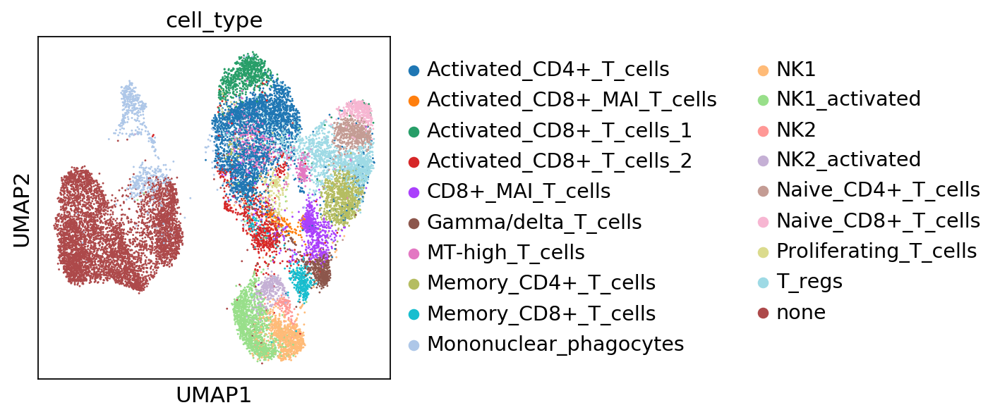

In [37]:
sc.pl.umap(adata_hvg,color='cell_type')

In [24]:
sc.tl.louvain(adata_hvg, resolution=0.37, restrict_to=('louvain', ['0','1']), key_added='louvain_B_new')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:00.35) --> found 12 clusters and added
    'louvain_B_new', the cluster labels (adata.obs, categorical)


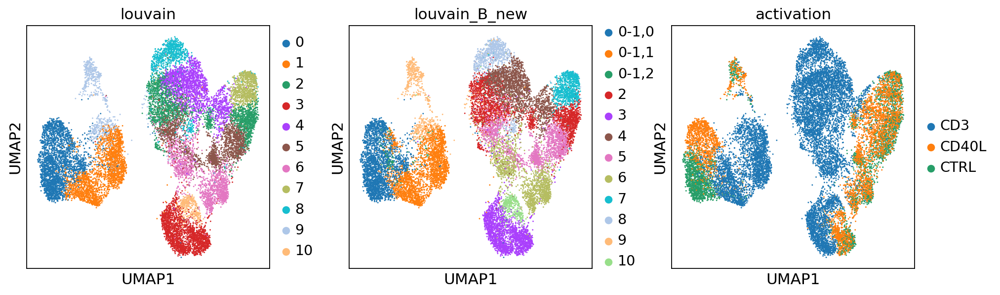

In [25]:
sc.pl.umap(adata_hvg, color=['louvain', 'louvain_B_new', 'activation'])

In [55]:
sc.tl.louvain(adata_hvg, resolution=0.4, restrict_to=('louvain', ['0','1']), key_added='louvain_B')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:00.38) --> found 13 clusters and added
    'louvain_B', the cluster labels (adata.obs, categorical)


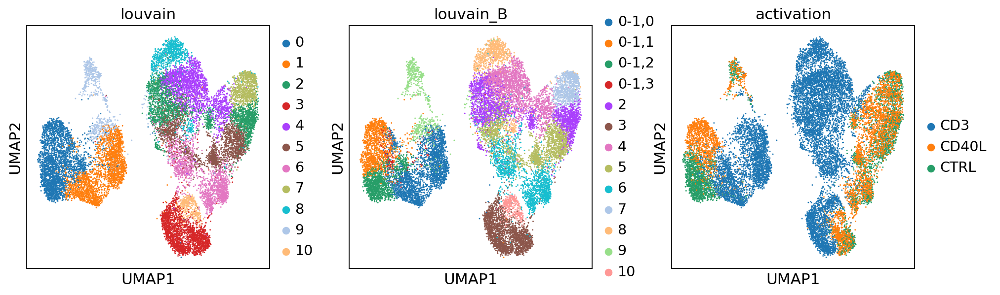

In [10]:
sc.pl.umap(adata_hvg, color=['louvain', 'louvain_B', 'activation'])

In [13]:
np.unique(adata_hvg[adata_hvg.obs['louvain_B'] == '0-1,3'].obs['activation'], return_counts=True)

(array(['CD3', 'CD40L', 'CTRL'], dtype=object), array([50, 61, 63]))

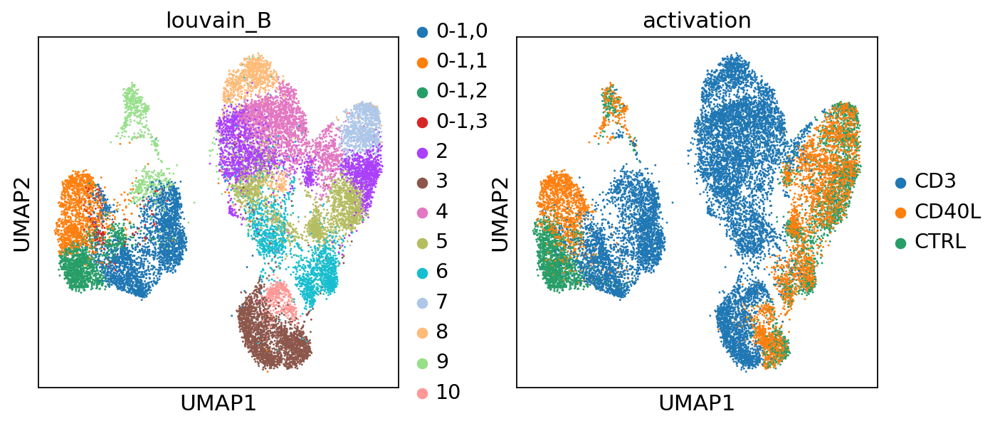

In [57]:
sc.pl.umap(adata_hvg, color=['louvain_B','activation'])

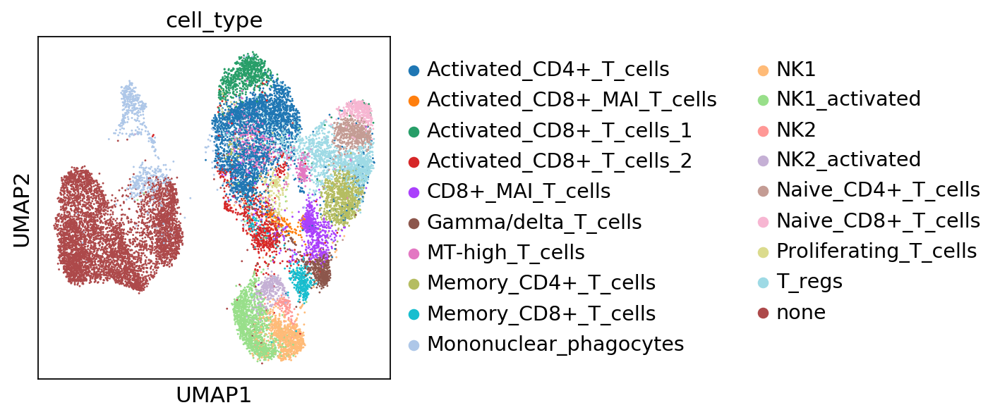

In [8]:
sc.pl.umap(adata_hvg, color='cell_type')

In [9]:
# little corrections
sc.tl.louvain(adata_hvg, resolution=1.0, restrict_to=('cell_type', ['T_regs']), key_added='louvain_corrections')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:00.07) --> found 23 clusters and added
    'louvain_corrections', the cluster labels (adata.obs, categorical)


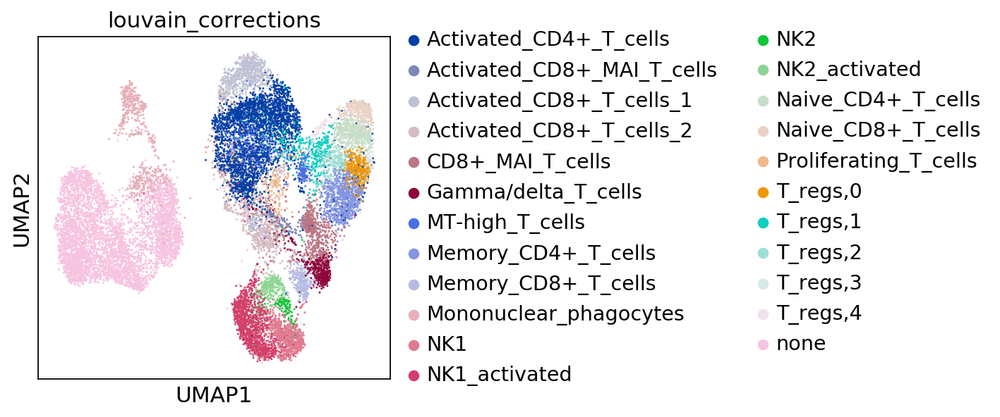

In [10]:
sc.pl.umap(adata_hvg, color='louvain_corrections')

In [11]:
# T-regs,4 goes to Naive CD8+ T cells
def annot_corrections_1(cell_id):
    if adata_hvg.obs.loc[cell_id, 'louvain_corrections'] == 'T_regs,4':
        return('Naive_CD8+_T_cells')
    else:
        return(adata_hvg.obs.loc[cell_id, 'cell_type'])

In [12]:
adata_hvg.obs['cell_type'] = adata_hvg.obs['cell_id'].apply(lambda x: annot_corrections_1(x))

... storing 'cell_type' as categorical


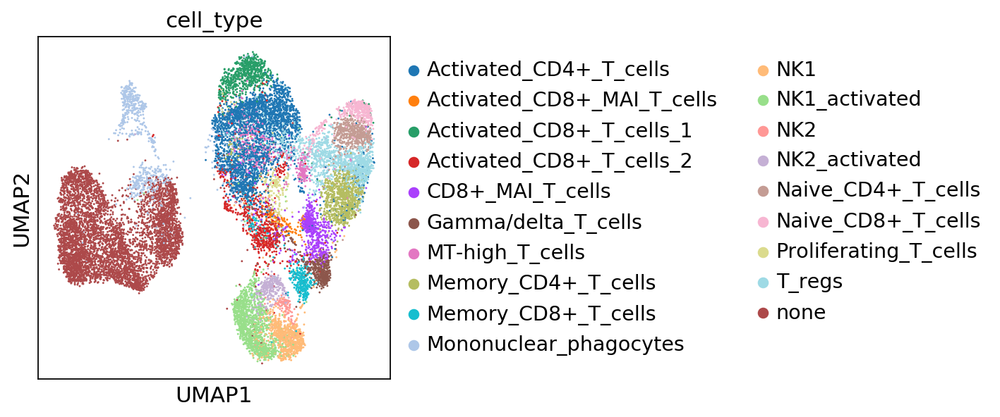

In [13]:
sc.pl.umap(adata_hvg, color='cell_type')

In [14]:
# little corrections from Javi
sc.tl.louvain(adata_hvg, resolution=0.3, restrict_to=('cell_type', ['Activated_CD8+_T_cells_2']), 
              key_added='louvain_corrections_2')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:00.11) --> found 21 clusters and added
    'louvain_corrections_2', the cluster labels (adata.obs, categorical)


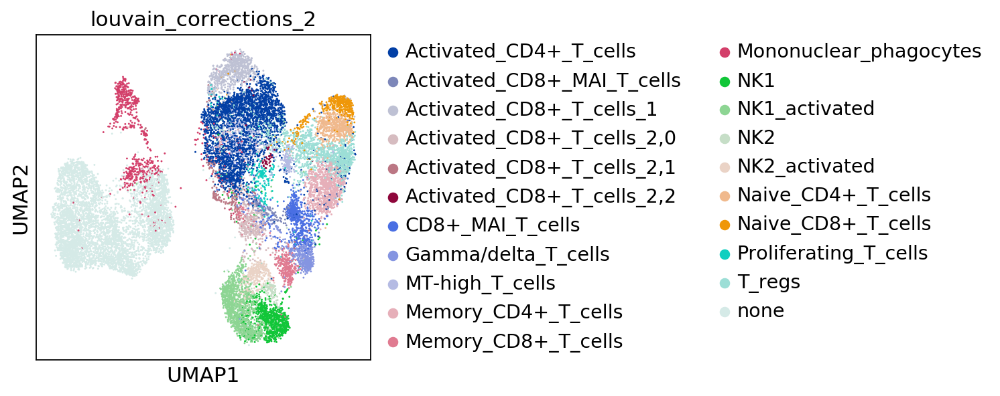

In [15]:
sc.pl.umap(adata_hvg, color='louvain_corrections_2')

In [16]:
# T-regs,4 goes to Naive CD8+ T cells
def annot_corrections_2(cell_id):
    if adata_hvg.obs.loc[cell_id, 'louvain_corrections_2'] == 'Activated_CD8+_T_cells_2,1':
        return('Activated_CD4+_T_cells')
    else:
        return(adata_hvg.obs.loc[cell_id, 'cell_type'])

In [17]:
adata_hvg.obs['cell_type'] = adata_hvg.obs['cell_id'].apply(lambda x: annot_corrections_2(x))

... storing 'cell_type' as categorical


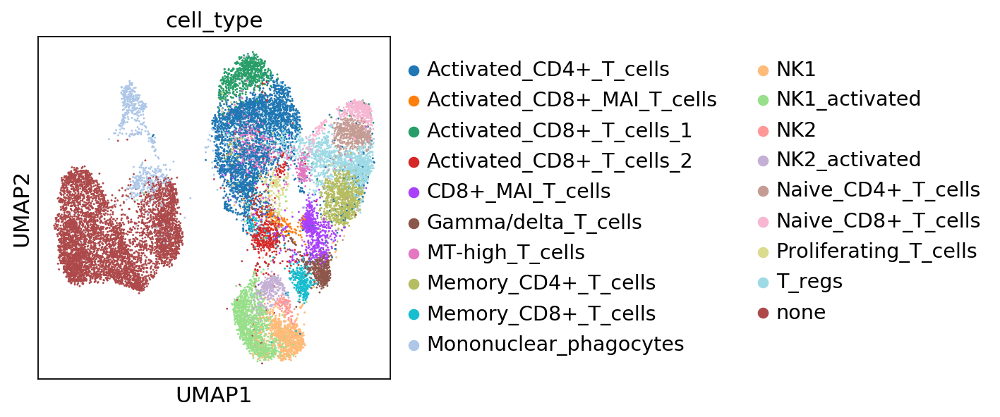

In [18]:
sc.pl.umap(adata_hvg, color='cell_type')

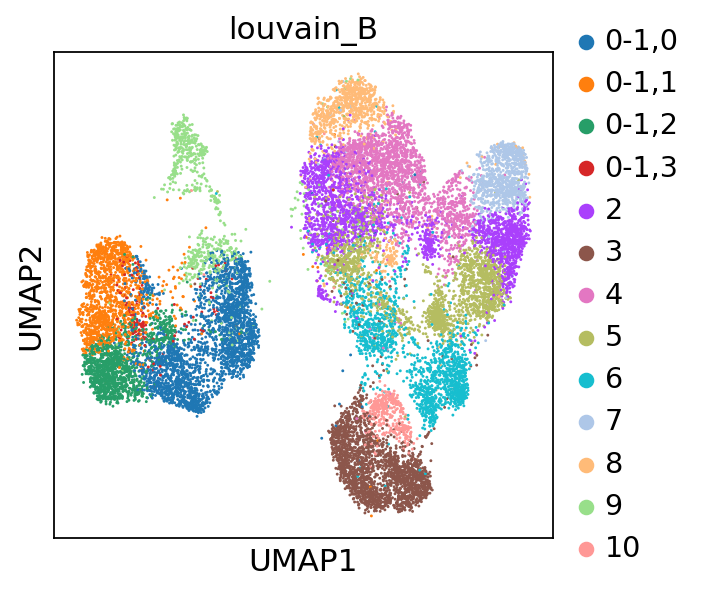

In [18]:
sc.pl.umap(adata_hvg, color='louvain_B')

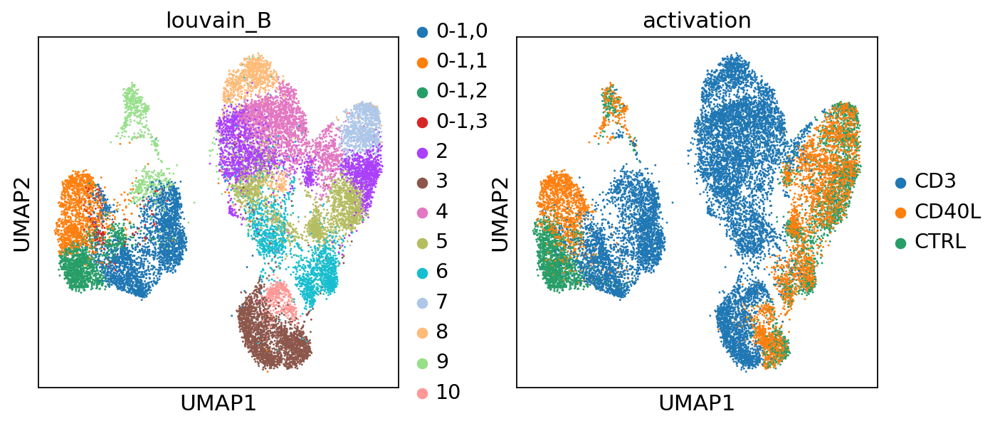

In [24]:
sc.pl.umap(adata_hvg, color=['louvain_B', 'activation'])

In [19]:
# B cell cluster assignment
def annot_B_cells(cell_id):
    if adata_hvg.obs.loc[cell_id, 'louvain_B'] == '0-1,0':
        return('B_cells_CD3_like')
    if adata_hvg.obs.loc[cell_id, 'louvain_B'] == '0-1,1':
        return('B_cells_CD40L_like')
    if adata_hvg.obs.loc[cell_id, 'louvain_B'] == '0-1,2':
        return('B_cells_CTRL_like')
    if adata_hvg.obs.loc[cell_id, 'louvain_B'] == '0-1,3':
        return('B_cells_IGHV4_oligoclonal')
    else:
        return(adata_hvg.obs.loc[cell_id, 'cell_type'])

In [20]:
adata_hvg.obs['cell_type'] = adata_hvg.obs['cell_id'].apply(lambda x: annot_B_cells(x))

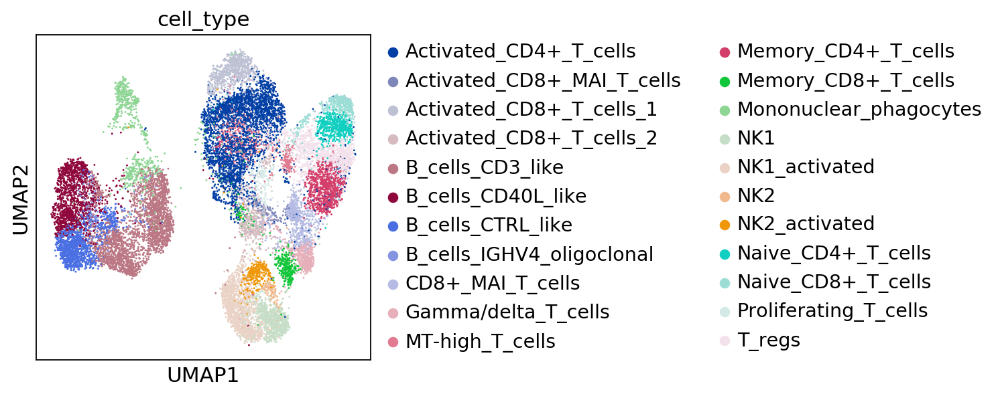

In [22]:
sc.pl.umap(adata_hvg, color=['cell_type'])

### Getting T:B doublets

In [5]:
adata_vdj = sc.read('./adata_10X_B_cells_vdj.h5ad')

In [6]:
adata_vdj.obs.columns

Index(['activation', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes',
       'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score',
       'technique', 'is_doublet', 'cell_id', 'seq_batch', 'louvain',
       'is_doublet_poptrim', 'cell_type', 'louvain_R9', 'louvain_B',
       'louvain_NK', 'louvain_NK_1', 'louvain_myel', 'louvain_R_Tcells_7',
       'louvain_R_Tcells_24568', 'louvain_R_Tcells_24568_extra',
       'louvain_R_Tcells_24568_extra_extra', 'louvain_corrections',
       'louvain_corrections_2', 'vdj_obs', 'vdj_has_vdjdata', 'vdj_clonotype',
       'vdj_clone_count', 'vdj_is_clone', 'vdj_is_productive'],
      dtype='object')

In [7]:
np.unique(adata_vdj.obs.index == adata_hvg.obs.index)

array([ True])

In [8]:
adata_hvg.obs['has_Bcell_vdj_data'] = adata_vdj.obs['vdj_has_vdjdata']

In [9]:
np.unique(adata_hvg.obs['has_Bcell_vdj_data'])

array([False,  True])

In [10]:
np.unique(adata_hvg.obs['cell_type'])

array(['Activated_CD4+_T_cells', 'Activated_CD8+_MAI_T_cells',
       'Activated_CD8+_T_cells_1', 'Activated_CD8+_T_cells_2',
       'B_cells_CD3_like', 'B_cells_CD40L_like', 'B_cells_CTRL_like',
       'B_cells_IGHV4_oligoclonal', 'CD8+_MAI_T_cells',
       'Gamma/delta_T_cells', 'MT-high_T_cells', 'Memory_CD4+_T_cells',
       'Memory_CD8+_T_cells', 'Mononuclear_phagocytes', 'NK1',
       'NK1_activated', 'NK2', 'NK2_activated', 'Naive_CD4+_T_cells',
       'Naive_CD8+_T_cells', 'Proliferating_T_cells', 'T:B_doublets',
       'T_regs'], dtype=object)

In [11]:
np.unique(adata_hvg.obs['is_doublet_poptrim'])

array([False,  True])

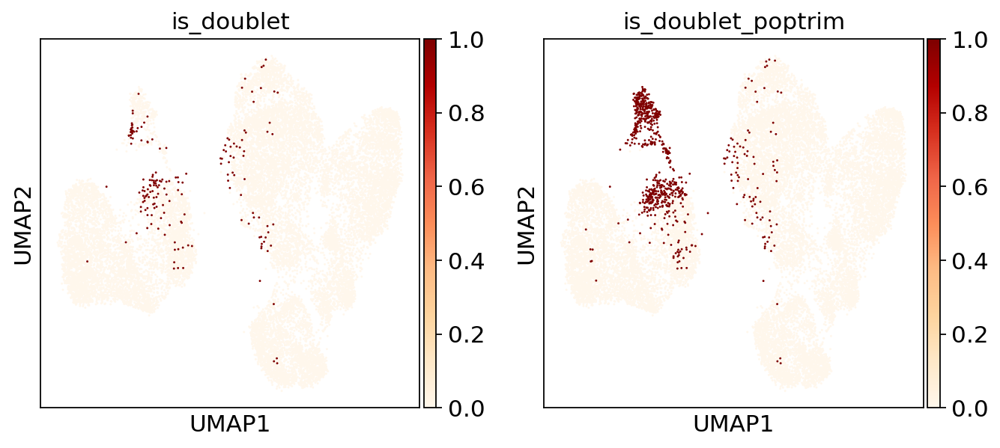

In [24]:
sc.pl.umap(adata_hvg, color=['is_doublet','is_doublet_poptrim'], cmap='OrRd')

In [26]:
def annot_doublets(cell_id):
    if (adata_hvg.obs.loc[cell_id,'has_Bcell_vdj_data'] == True) & (adata_hvg.obs.loc[cell_id,'cell_type'] in ['Activated_CD4+_T_cells', 'Activated_CD8+_MAI_T_cells',
       'Activated_CD8+_T_cells_1', 'Activated_CD8+_T_cells_2',
       'CD8+_MAI_T_cells', 'Gamma/delta_T_cells', 'MT-high_T_cells', 'Memory_CD4+_T_cells',
       'Memory_CD8+_T_cells', 'Naive_CD4+_T_cells',
       'Naive_CD8+_T_cells', 'Proliferating_T_cells', 'T_regs']):
        return('T:B_doublets')
    if adata_hvg.obs.loc[cell_id,'is_doublet_poptrim'] == True:
        print('caught poptrim doublet')
        return('Doublets')
    else:
        return(adata_hvg.obs.loc[cell_id,'cell_type'])

In [27]:
adata_hvg.obs['cell_type'] = adata_hvg.obs['cell_id'].apply(lambda x: annot_doublets(x))

caught poptrim doublet
caught poptrim doublet
caught poptrim doublet
caught poptrim doublet
caught poptrim doublet
caught poptrim doublet
caught poptrim doublet
caught poptrim doublet
caught poptrim doublet
caught poptrim doublet
caught poptrim doublet
caught poptrim doublet
caught poptrim doublet
caught poptrim doublet
caught poptrim doublet
caught poptrim doublet
caught poptrim doublet
caught poptrim doublet
caught poptrim doublet
caught poptrim doublet
caught poptrim doublet
caught poptrim doublet
caught poptrim doublet
caught poptrim doublet
caught poptrim doublet
caught poptrim doublet
caught poptrim doublet
caught poptrim doublet
caught poptrim doublet
caught poptrim doublet
caught poptrim doublet
caught poptrim doublet
caught poptrim doublet
caught poptrim doublet
caught poptrim doublet
caught poptrim doublet
caught poptrim doublet
caught poptrim doublet
caught poptrim doublet
caught poptrim doublet
caught poptrim doublet
caught poptrim doublet
caught poptrim doublet
caught popt

... storing 'cell_type' as categorical


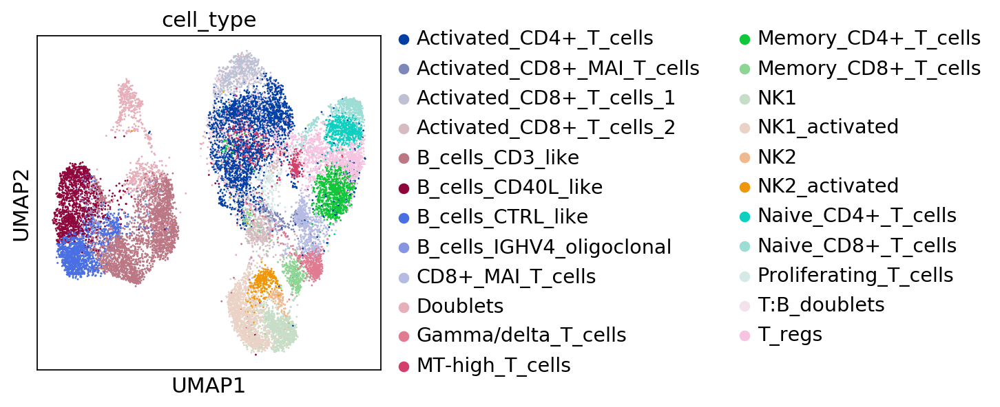

In [28]:
sc.pl.umap(adata_hvg, color=['cell_type'])

In [20]:
# and then marking the weird cells close to B cells as 'Doublets' as well
sc.tl.louvain(adata_hvg, restrict_to=('cell_type',['Doublets']), 
              key_added='myel_refine', resolution=1)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 49 clusters and added
    'myel_refine', the cluster labels (adata.obs, categorical) (0:00:00)


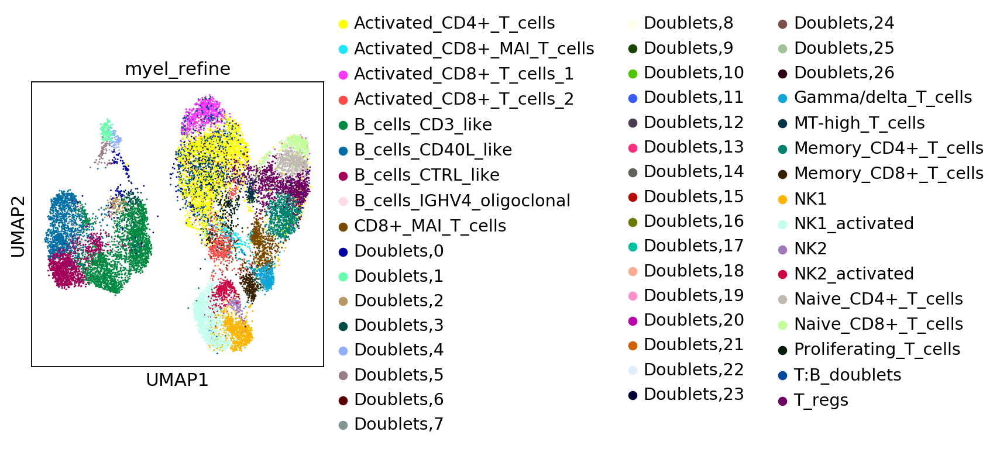

In [21]:
sc.pl.umap(adata_hvg,color='myel_refine')

In [22]:
def re_myel(adata_obj, cell_id):
    curr_myel_cluster = adata_obj.obs.loc[cell_id, 'myel_refine']
    if curr_myel_cluster in ['Doublets,1','Doublets,4']:
        return('Myeloid_cells')
    else:
        return(adata_obj.obs.loc[cell_id, 'cell_type'])

In [23]:
adata_hvg.obs['cell_type'] = adata_hvg.obs['cell_id'].apply(lambda x: re_myel(adata_hvg,x))

... storing 'cell_type' as categorical


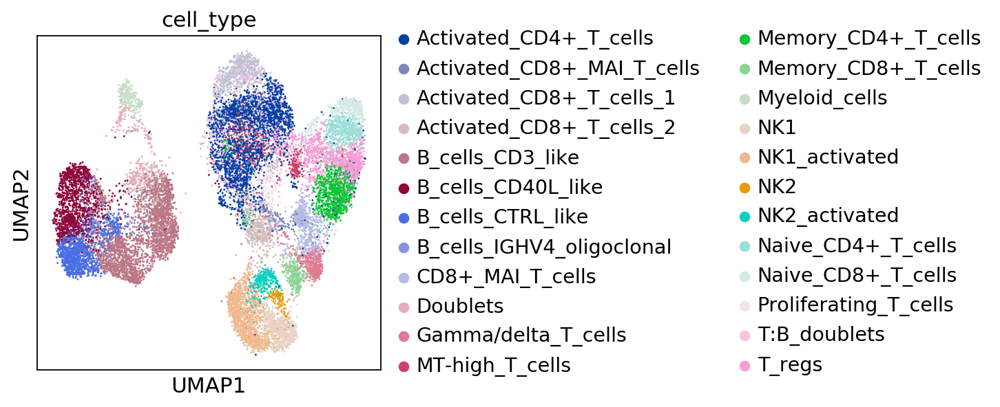

In [24]:
sc.pl.umap(adata_hvg, color='cell_type')

In [26]:
len(adata_hvg.uns["cell_type_colors"])

24

In [ ]:
# making doublets grey
new_colors = adata_hvg.uns["cell_type_colors"][:9]+['silver']+adata_hvg.uns["cell_type_colors"][10:]

# THIS IS THE FINAL VERSION OF THE DATA



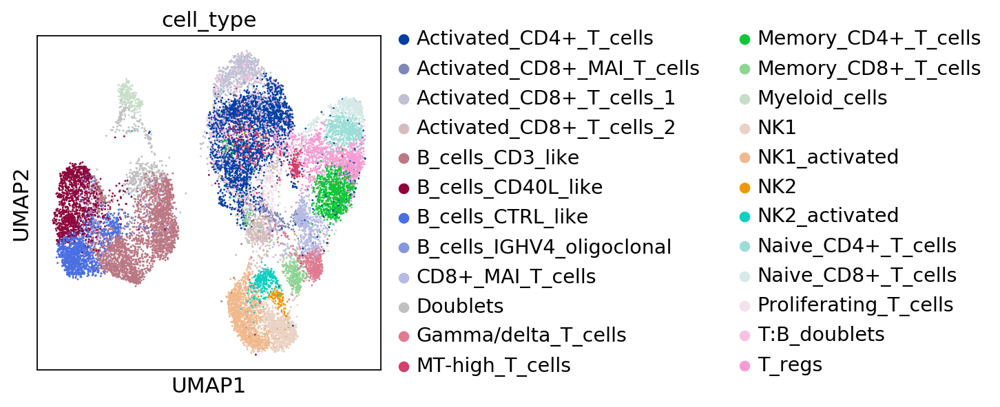

In [11]:
sc.pl.umap(adata_hvg, color='cell_type',
           save='_final_all_10X.pdf')

In [33]:
adata_hvg.write('./adata_10X.h5ad')

### Plotting marker genes

In [4]:
adata_hvg = sc.read('./adata_10X.h5ad')

In [5]:
marker_genes = ['CD3D','CD8A', 'CCL5', 'IL7R', 'GZMB', 'KLRB1', 'GZMK',
                'ANXA1', 'IL2RA', 'TRDV2',
                'PRF1', 'FCGR3A', 'GZMH', 'XCL1', 'CCND2',
                'CD19', 'HLA-DRA', 'IGHV4-28', 'CD14','CD36']

In [9]:
adata_full = anndata.AnnData(X = adata_hvg.raw.X, obs=adata_hvg.obs, 
                             var=adata_hvg.raw.var, raw=adata_hvg.raw)


saving figure to file ./figures/stacked_violinviolin_plot_dendrogram.pdf


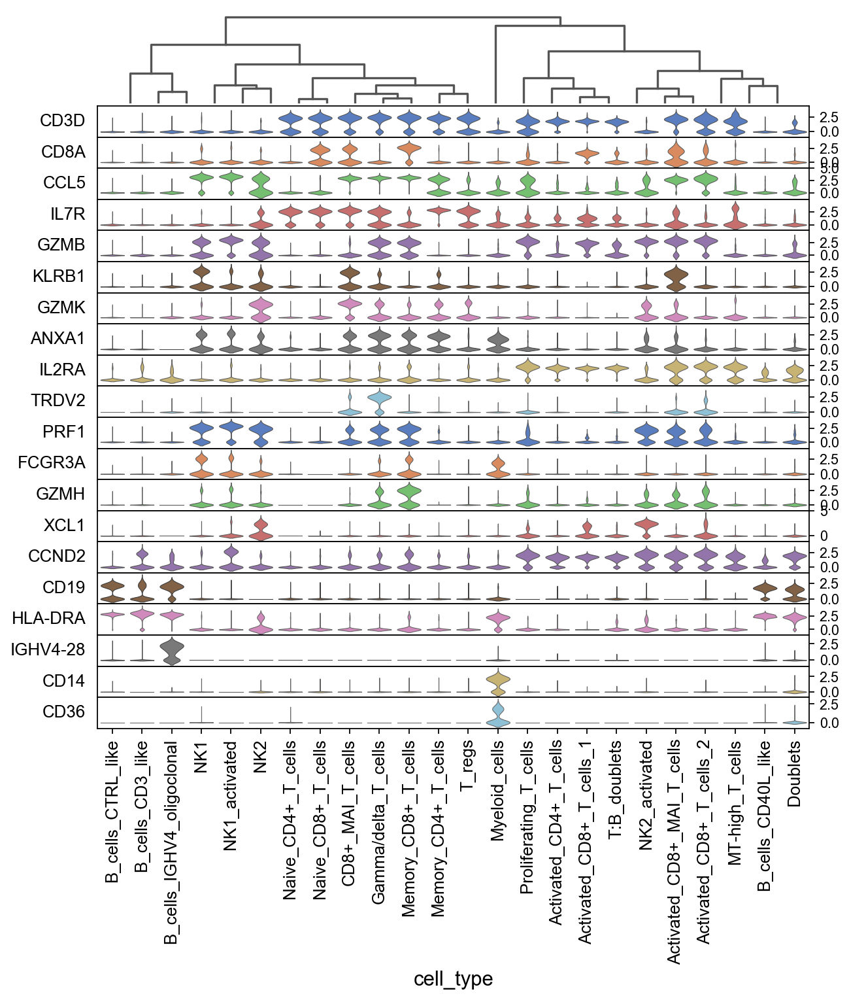

In [52]:
sc.pl.stacked_violin(adata_full, marker_genes, groupby='cell_type',use_raw=True, swap_axes=True,
                    save = '_10X_dendrogram.pdf', dendrogram=True)

# DE analysis with limma

In [ ]:
adata_full_raw = anndata.AnnData(X=adata_hvg.raw.X,
                            obs=adata_hvg.obs,
                            var=adata_hvg.raw.var,
                            obsm=adata_hvg.obsm)

In [24]:
# marker calling

t = adata_full_raw.X.toarray().T
df = pd.DataFrame(data=t, columns= adata_full_raw.obs.index, index=adata_full_raw.var_names)

meta_df = pd.DataFrame(data={'Cell':list(adata_full_raw.obs.index),
                             'cell_type':[ str(i) for i in adata_hvg.obs['collective_annot']],
                             'sample':[ str(i) for i in adata_full_raw.obs['sample']]})
meta_df.set_index('Cell', inplace=True)

In [25]:
meta_df

,cell_type,sample,covariate
Cell,,,
AAACCTGCAGACAAGC-1,NK1_CVID,Immunodeficiency8103070,1
AAACCTGCATGTTCCC-1,NK2_CVID,Immunodeficiency8103070,1
AAACCTGGTCTCTCTG-1,NK1_activated_CVID,Immunodeficiency8103070,1
AAACCTGTCGAACTGT-1,Memory_CD4+_T_cells_CVID,Immunodeficiency8103070,1
AAACGGGAGATGAGAG-1,T_regs_CVID,Immunodeficiency8103070,1
...,...,...,...
TTTGTCACATCGTCGG-1,Activated_CD4+_T_cells_CONTROL,Immunodeficiency8103077,4
TTTGTCAGTAAATGTG-1,B_cells_CTRL_like_CONTROL,Immunodeficiency8103077,4
TTTGTCAGTATCTGCA-1,B_cells_CD3_like_CONTROL,Immunodeficiency8103077,4


In [26]:
np.unique(meta_df['cell_type'], return_counts=True)

(array(['Activated_CD4+_T_cells_CONTROL', 'Activated_CD4+_T_cells_CVID',
        'Activated_CD8+_MAI_T_cells_CONTROL',
        'Activated_CD8+_MAI_T_cells_CVID',
        'Activated_CD8+_T_cells_1_CONTROL',
        'Activated_CD8+_T_cells_1_CVID',
        'Activated_CD8+_T_cells_2_CONTROL',
        'Activated_CD8+_T_cells_2_CVID', 'B_cells_CD3_like_CONTROL',
        'B_cells_CD3_like_CVID', 'B_cells_CD40L_like_CONTROL',
        'B_cells_CD40L_like_CVID', 'B_cells_CTRL_like_CONTROL',
        'B_cells_CTRL_like_CVID', 'B_cells_IGHV4_oligoclonal_CONTROL',
        'B_cells_IGHV4_oligoclonal_CVID', 'CD8+_MAI_T_cells_CONTROL',
        'CD8+_MAI_T_cells_CVID', 'Gamma/delta_T_cells_CONTROL',
        'Gamma/delta_T_cells_CVID', 'MT-high_T_cells_CONTROL',
        'MT-high_T_cells_CVID', 'Memory_CD4+_T_cells_CONTROL',
        'Memory_CD4+_T_cells_CVID', 'Memory_CD8+_T_cells_CONTROL',
        'Memory_CD8+_T_cells_CVID', 'Mononuclear_phagocytes_CONTROL',
        'Mononuclear_phagocytes_CVID', 'NK1_C

In [27]:
%load_ext rpy2.ipython

In [28]:
outpath = './10X_DE_limma/'

In [29]:
%%R
library(limma)
library(edgeR)

In [30]:
meta_df.reset_index(inplace=True)

In [31]:
meta_df

,Cell,cell_type,sample,covariate
0,AAACCTGCAGACAAGC-1,NK1_CVID,Immunodeficiency8103070,1
1,AAACCTGCATGTTCCC-1,NK2_CVID,Immunodeficiency8103070,1
2,AAACCTGGTCTCTCTG-1,NK1_activated_CVID,Immunodeficiency8103070,1
3,AAACCTGTCGAACTGT-1,Memory_CD4+_T_cells_CVID,Immunodeficiency8103070,1
4,AAACGGGAGATGAGAG-1,T_regs_CVID,Immunodeficiency8103070,1
...,...,...,...,...
17657,TTTGTCACATCGTCGG-1,Activated_CD4+_T_cells_CONTROL,Immunodeficiency8103077,4
17658,TTTGTCAGTAAATGTG-1,B_cells_CTRL_like_CONTROL,Immunodeficiency8103077,4
17659,TTTGTCAGTATCTGCA-1,B_cells_CD3_like_CONTROL,Immunodeficiency8103077,4
17660,TTTGTCAGTCAATACC-1,B_cells_CD3_like_CONTROL,Immunodeficiency8103077,4


In [60]:
# because R replace '-' with '.' in df for some reason
def rename_Cell(cell_id):
    return(cell_id.replace('-','.'))

In [33]:
meta_df['Cell'] = meta_df['Cell'].apply(lambda x: rename_Cell(x))

In [34]:
meta_df

,Cell,cell_type,sample,covariate
0,AAACCTGCAGACAAGC.1,NK1_CVID,Immunodeficiency8103070,1
1,AAACCTGCATGTTCCC.1,NK2_CVID,Immunodeficiency8103070,1
2,AAACCTGGTCTCTCTG.1,NK1_activated_CVID,Immunodeficiency8103070,1
3,AAACCTGTCGAACTGT.1,Memory_CD4+_T_cells_CVID,Immunodeficiency8103070,1
4,AAACGGGAGATGAGAG.1,T_regs_CVID,Immunodeficiency8103070,1
...,...,...,...,...
17657,TTTGTCACATCGTCGG.1,Activated_CD4+_T_cells_CONTROL,Immunodeficiency8103077,4
17658,TTTGTCAGTAAATGTG.1,B_cells_CTRL_like_CONTROL,Immunodeficiency8103077,4
17659,TTTGTCAGTATCTGCA.1,B_cells_CD3_like_CONTROL,Immunodeficiency8103077,4
17660,TTTGTCAGTCAATACC.1,B_cells_CD3_like_CONTROL,Immunodeficiency8103077,4


In [35]:
df

index,AAACCTGCAGACAAGC-1,AAACCTGCATGTTCCC-1,AAACCTGGTCTCTCTG-1,AAACCTGTCGAACTGT-1,AAACGGGAGATGAGAG-1,AAACGGGCAAGCTGAG-1,AAACGGGCAGGTGGAT-1,AAACGGGGTCACTTCC-1,AAACGGGGTCCGAATT-1,AAAGATGCATAGAAAC-1,...,TTTGGTTTCTTCATGT-1,TTTGTCAAGCCATCGC-1,TTTGTCAAGGCACATG-1,TTTGTCACAGCTGCTG-1,TTTGTCACATCGGTTA-1,TTTGTCACATCGTCGG-1,TTTGTCAGTAAATGTG-1,TTTGTCAGTATCTGCA-1,TTTGTCAGTCAATACC-1,TTTGTCAGTTGAACTC-1
index,,,,,,,,,,,,,,,,,,,,,
RP11-34P13.7,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
FO538757.3,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
FO538757.2,0.0,0.0,0.0,1.951033,2.049723,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AP006222.2,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
RP5-857K21.4,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
XXbac-BPGBPG55C20.3,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
RP13-735L24.1,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CDH2,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [36]:
np.unique(meta_df['cell_type'], return_counts=True)

(array(['Activated_CD4+_T_cells_CONTROL', 'Activated_CD4+_T_cells_CVID',
        'Activated_CD8+_MAI_T_cells_CONTROL',
        'Activated_CD8+_MAI_T_cells_CVID',
        'Activated_CD8+_T_cells_1_CONTROL',
        'Activated_CD8+_T_cells_1_CVID',
        'Activated_CD8+_T_cells_2_CONTROL',
        'Activated_CD8+_T_cells_2_CVID', 'B_cells_CD3_like_CONTROL',
        'B_cells_CD3_like_CVID', 'B_cells_CD40L_like_CONTROL',
        'B_cells_CD40L_like_CVID', 'B_cells_CTRL_like_CONTROL',
        'B_cells_CTRL_like_CVID', 'B_cells_IGHV4_oligoclonal_CONTROL',
        'B_cells_IGHV4_oligoclonal_CVID', 'CD8+_MAI_T_cells_CONTROL',
        'CD8+_MAI_T_cells_CVID', 'Gamma/delta_T_cells_CONTROL',
        'Gamma/delta_T_cells_CVID', 'MT-high_T_cells_CONTROL',
        'MT-high_T_cells_CVID', 'Memory_CD4+_T_cells_CONTROL',
        'Memory_CD4+_T_cells_CVID', 'Memory_CD8+_T_cells_CONTROL',
        'Memory_CD8+_T_cells_CVID', 'Mononuclear_phagocytes_CONTROL',
        'Mononuclear_phagocytes_CVID', 'NK1_C

In [ ]:
# groups regarded in DE analysis
comparison_groups = ['Activated_CD4+_T_cells','Memory_CD4+_T_cells','Activated_CD8+_MAI_T_cells',
              'Memory_CD8+_T_cells', 'Activated_CD8+_T_cells_1', 'Naive_CD4+_T_cells',
              'Activated_CD8+_T_cells_2', 'Naive_CD8+_T_cells', 'B_cells_CD3_like',
              'NK1_activated', 'B_cells_CD40L_like', 'NK1', 'B_cells_CTRL_like', 'NK2_activated', 
               'CD8+_MAI_T_cells', 'NK2', 'Gamma/delta_T_cells', 'T_regs']

In [71]:
# doing this sequentially for all the comparison groups, CVID vs CONTROL
case = 'NK2_activated_CVID'
ctrl = 'NK2_activated_CONTROL'

In [72]:
%%R -i df -i meta_df -i outpath -i ctrl -i case 

library(limma)
library(edgeR)

# Format
ex_mat=as.matrix(df)
rownames(meta_df) = meta_df$Cell

# subset meta
meta_df = subset(meta_df, cell_type %in% unlist(c(ctrl, case)) )
print(unique(meta_df$cell_type))

# Shared cells
shared_cells = intersect(rownames(meta_df), colnames(ex_mat))
message(length(shared_cells), ' shared cells')
ex_mat = ex_mat[, shared_cells]
meta_df = meta_df[shared_cells,]

# Filter lowly expressed genes
keep = rowSums(ex_mat, na.rm=T) > 0.1
ex_mat = ex_mat[ keep, ]
keep = aveLogCPM(ex_mat) > 0.1
ex_mat = ex_mat[ keep, ]

# Extract celltypes
cells = rownames(meta_df)
celltypes = unique(meta_df$cell_type)

# Extract cells in cluster and rest
cells_case = rownames(subset(meta_df, cell_type == case))
cells_ctrl = rownames(subset(meta_df, cell_type == ctrl)) # changed from control to ctrl

# build cluster_type vector
cluster_type = rep(0, length(cells))
names(cluster_type) = cells
cluster_type[ cells_case ] = 'case'
cluster_type[ cells_ctrl ] = 'ctrl'

print(unique(cluster_type))

design.matrix <- model.matrix(~ 0 + cluster_type)

# Now tell limma how do you want to compare (i.e. case vs control)
contrast.matrix <- makeContrasts(caseVScontrol = cluster_typecase - cluster_typectrl, levels = design.matrix)

# Make model and run contrasts
fit <- lmFit(ex_mat, design.matrix)
fit <- contrasts.fit(fit, contrast.matrix)
fit <- eBayes(fit)

# Make a dataframe containing the important data
results = topTable(fit, adjust="fdr", number = nrow(ex_mat), coef = 'caseVScontrol')

# Add and filter needed data
results$Gene = rownames(results)
results = results[ , c('Gene', 'logFC', 'P.Value', 'adj.P.Val')]
results$AveExpr_cluster = apply(ex_mat[ results$Gene, cells_case], 1, mean)
results$AveExpr_rest = apply(ex_mat[ results$Gene, cells_ctrl], 1, mean)
results$percentExpr_cluster = apply(ex_mat[ results$Gene, cells_case], 1, function(x) sum(c(x > 0)+0) ) / length(cells_case)
results$percentExpr_rest = apply(ex_mat[ results$Gene, cells_ctrl], 1, function(x) sum(c(x > 0)+0) ) / length(cells_ctrl)

results$AveExpr_cluster = round(results$AveExpr_cluster, 6)
results$AveExpr_rest = round(results$AveExpr_rest, 6)
results$percentExpr_cluster = round(results$percentExpr_cluster, 6)
results$percentExpr_rest = round(results$percentExpr_rest, 6)
# and store it as csv file
write.csv(results, file = paste0(outpath, case, '_vs_', ctrl, '_limma_DEGs.csv'), row.names = F, col.names = T, quote = F)

[1] "NK2_activated_CVID"    "NK2_activated_CONTROL"


R[write to console]: 315 shared cells



[1] "case" "ctrl"


In [60]:
# this was separate for Gamma/delta because of the slash in the name

%%R
write.csv(results, file = paste0(outpath, 'Gamma-delta_T_cells_CVID', '_vs_', 'Gamma-delta_T_cells_CONTROL', '_limma_DEGs.csv'), row.names = F, col.names = T, quote = F)

In [74]:
np.unique(meta_df['cell_type'], return_counts=True)

(array(['Activated_CD4+_T_cells_CONTROL', 'Activated_CD4+_T_cells_CVID',
        'Activated_CD8+_MAI_T_cells_CONTROL',
        'Activated_CD8+_MAI_T_cells_CVID',
        'Activated_CD8+_T_cells_1_CONTROL',
        'Activated_CD8+_T_cells_1_CVID',
        'Activated_CD8+_T_cells_2_CONTROL',
        'Activated_CD8+_T_cells_2_CVID', 'B_cells_CD3_like_CONTROL',
        'B_cells_CD3_like_CVID', 'B_cells_CD40L_like_CONTROL',
        'B_cells_CD40L_like_CVID', 'B_cells_CTRL_like_CONTROL',
        'B_cells_CTRL_like_CVID', 'B_cells_IGHV4_oligoclonal_CONTROL',
        'B_cells_IGHV4_oligoclonal_CVID', 'CD8+_MAI_T_cells_CONTROL',
        'CD8+_MAI_T_cells_CVID', 'Gamma/delta_T_cells_CONTROL',
        'Gamma/delta_T_cells_CVID', 'MT-high_T_cells_CONTROL',
        'MT-high_T_cells_CVID', 'Memory_CD4+_T_cells_CONTROL',
        'Memory_CD4+_T_cells_CVID', 'Memory_CD8+_T_cells_CONTROL',
        'Memory_CD8+_T_cells_CVID', 'Mononuclear_phagocytes_CONTROL',
        'Mononuclear_phagocytes_CVID', 'NK1_C

### Saving the object for cellxgene

In [6]:
adata_hvg

AnnData object with n_obs × n_vars = 17662 × 4045 
    obs: 'activation', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet', 'cell_id', 'seq_batch', 'louvain', 'is_doublet_poptrim', 'cell_type', 'louvain_R9', 'louvain_B', 'louvain_NK', 'louvain_NK_1', 'louvain_myel', 'louvain_R_Tcells_7', 'louvain_R_Tcells_24568', 'louvain_R_Tcells_24568_extra', 'louvain_R_Tcells_24568_extra_extra', 'louvain_corrections', 'louvain_corrections_2', 'has_Bcell_vdj_data', 'myel_refine'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'highly_variable-2', 'means-2', 'dispersions-2', 'dispersions_norm-2', 'gene_ids-3', 'feature_types-3',

In [19]:
adata_full = anndata.AnnData(X=adata_hvg.raw.X,
                            obs=adata_hvg.obs,
                            var=adata_hvg.raw.var,
                            obsm=adata_hvg.obsm)

In [20]:
adata_full

AnnData object with n_obs × n_vars = 17662 × 17976 
    obs: 'activation', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet', 'cell_id', 'seq_batch', 'louvain', 'is_doublet_poptrim', 'cell_type', 'louvain_R9', 'louvain_B', 'louvain_NK', 'louvain_NK_1', 'louvain_myel', 'louvain_R_Tcells_7', 'louvain_R_Tcells_24568', 'louvain_R_Tcells_24568_extra', 'louvain_R_Tcells_24568_extra_extra', 'louvain_corrections', 'louvain_corrections_2', 'has_Bcell_vdj_data', 'myel_refine'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'highly_variable-2', 'means-2', 'dispersions-2', 'dispersions_norm-2', 'gene_ids-3', 'feature_types-3'

In [21]:
adata_full.obs.columns

Index(['activation', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes',
       'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score',
       'technique', 'is_doublet', 'cell_id', 'seq_batch', 'louvain',
       'is_doublet_poptrim', 'cell_type', 'louvain_R9', 'louvain_B',
       'louvain_NK', 'louvain_NK_1', 'louvain_myel', 'louvain_R_Tcells_7',
       'louvain_R_Tcells_24568', 'louvain_R_Tcells_24568_extra',
       'louvain_R_Tcells_24568_extra_extra', 'louvain_corrections',
       'louvain_corrections_2', 'has_Bcell_vdj_data', 'myel_refine'],
      dtype='object')

In [22]:
# subsetting only relevant metadata
adata_full.obs = adata_full.obs[['activation', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes',
       'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score',
       'is_doublet', 'cell_id', 'seq_batch',
       'is_doublet_poptrim', 'cell_type']]

In [23]:
adata_full.obs.columns

Index(['activation', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes',
       'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score',
       'is_doublet', 'cell_id', 'seq_batch', 'is_doublet_poptrim',
       'cell_type'],
      dtype='object')

In [24]:
adata_full.obs.columns = ['activation', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes',
       'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score',
       'is_doublet', 'cell_id', 'seq_batch', 'is_doublet_propagate', # changed from is_doublet_poptrim
       'cell_type']

In [25]:
adata_full

AnnData object with n_obs × n_vars = 17662 × 17976 
    obs: 'activation', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'is_doublet', 'cell_id', 'seq_batch', 'is_doublet_propagate', 'cell_type'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'highly_variable-2', 'means-2', 'dispersions-2', 'dispersions_norm-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'highly_variable-3', 'means-3', 'dispersions-3', 'dispersions_norm-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'highly_variable-4', 'means-4', 'dispersions-4', 'dispersions_norm-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'highly_varia

In [26]:
adata_full.X = scipy.sparse.csc_matrix(adata_full.X)


In [27]:
categ_columns = ['activation', 'batch', 'condition', 
                 'sample', 'is_doublet', 'cell_id', 'seq_batch', 'is_doublet_propagate', # changed from is_doublet_poptrim
       'cell_type']

cont_columns = ['bh_pval', 'n_counts', 'n_genes', 'percent_mito',
                'scrublet_cluster_score', 'scrublet_score']


In [28]:
import pandas
for column in categ_columns:
    adata_full.obs[column] = pd.Categorical(adata_full.obs[column])
    
for column in cont_columns:
    adata_full.obs[column] = np.float32(adata_full.obs[column])

In [29]:
adata_full.write('adata_10X_activation_cellxgene.h5ad')

In [30]:
adata_full = sc.read('adata_10X_activation_cellxgene.h5ad')